### **1. LIBRERIAS**


In [1]:
#Librerias
import time
import os
import pandas as pd
import numpy as np

#Librerias de profiling
from memory_profiler import memory_usage
import psutil
import matplotlib.pyplot as plt

#Librerías de visualización
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px

# SDV
from sdv.metadata import SingleTableMetadata
from sdv.single_table import TVAESynthesizer, CTGANSynthesizer
from sdmetrics.reports.single_table import QualityReport
from sdv.evaluation.single_table import get_column_pair_plot

# Modelos
from sklearn.svm import SVR, SVC
from sklearn.model_selection import train_test_split, RepeatedKFold
from sklearn.metrics import f1_score, mean_squared_error, accuracy_score
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.decomposition import PCA

### **2. Importación de datos**

In [2]:
data_VNA = pd.read_csv("PCA_GLY.csv", header=0, index_col=0)
data_VNA = data_VNA.rename(columns={'label': 'Label'})

data_ER = pd.read_csv("PCA_GLY_ER.csv", header=0, index_col=0)
data_ER = data_ER.drop(columns = 'Set')

my_metadata_VNA_dict = SingleTableMetadata()
my_metadata_VNA_dict.detect_from_dataframe(data=data_VNA)

my_metadata_ER_dict = SingleTableMetadata()
my_metadata_ER_dict.detect_from_dataframe(data=data_ER)

#### **2.1. Diccionarios**

In [3]:
# Dirección realtiva de guardado
save_folder = 'saves/'

#Nombre de las columnas relevantes VNA
tipos = data_VNA.dtypes
label_column = 'Label'
categorical_features = ['Label']

cat_columns = tipos[tipos == object].index
num_columns = tipos[tipos != object].index

columns_names_VNA = data_VNA.columns.values
columns_names_list_VNA = list(columns_names_VNA)

#Nombre de las columnas relevantes ER
tipos = data_ER.dtypes
label_column = 'Label'
categorical_features = ['Label']

cat_columns = tipos[tipos == object].index
num_columns = tipos[tipos != object].index

columns_names_ER = data_ER.columns.values
columns_names_list_ER = list(columns_names_ER)

In [4]:
substances = data_VNA[label_column].unique()
substances = np.append(substances, "ALL")

In [5]:
dict_data_products_VNA = {}

for product in substances:
    if product == "ALL":
      dict_data_products_VNA["ALL"] = data_VNA
    else:
      dict_data_products_VNA[product] = data_VNA[data_VNA[label_column]==product]

In [6]:
dict_data_products_ER = {}

for product in substances:
    if product == "ALL":
      dict_data_products_ER["ALL"] = data_ER
    else:
      dict_data_products_ER[product] = data_ER[data_ER[label_column]==product]

In [7]:
substance_permitivity_dict= {
    
    "GLY10": {
                "e_formula":      55.43,
                "e_literature":   74.32,
                "concentration":  10,
              },
    "GLY20": {
                "e_formula":      41.61,
                "e_literature":   69.23,
                "concentration":  20,
            },
    "GLY30": {
                "e_formula":      32.34,
                "e_literature":   65.25,
                "concentration":  30,
            },
    "GLY40": {
                "e_formula":      25.71,
                "e_literature":   58.78,
                "concentration":  40,
            },
    "GLY50": {
                "e_formula":      20.72,
                "e_literature":   51.55,
                "concentration":  50,
              },
    "GLY60": {
                "e_formula":      16.83,
                "e_literature":   39.00,
                "concentration":  60,
            },
    "GLY70": {
                "e_formula":      13.72,
                "e_literature":   27.45,
                "concentration":  70,
            },
    "GLY80": {
                "e_formula":      11.17,
                "e_literature":   17.00,
                "concentration":  80,
            },
    "WATER": {
                "e_formula":     78.3,
                "e_literature":  78.3 ,
                "concentration":  0,
            },
    "AIR": {
                "e_formula":      1,
                "e_literature":   1,
                "concentration":  110,
            },
}

substances_dict = data_VNA[label_column].unique()

dict_label_encoding_permitivity = {}
for product in substances_dict:
    dict_label_encoding_permitivity[product] = substance_permitivity_dict[product]["e_literature"]

dict_label_encoding_permitivity_inverse = {}
for product in substances_dict:
    dict_label_encoding_permitivity_inverse[substance_permitivity_dict[product]["e_literature"]] = product


substances_dict = data_VNA[label_column].unique()

dict_label_encoding = {}
encode=0
for product in substances_dict:
    dict_label_encoding[product] = encode
    encode+=20

dict_label_color = {}
colors = px.colors.qualitative.Light24
i=0
for product in substances_dict:
    dict_label_color[product] = colors[i]
    i+=1

#### **2.2. Gráficas**

In [8]:
fig = px.scatter(data_VNA, x='PC1', y='PC2', color=label_column, color_discrete_map = dict_label_color, title='PCA de VNA')
fig.show()

In [9]:
fig = px.scatter(data_ER, x='PC1', y='PC2', color=label_column, color_discrete_map = dict_label_color, title='PCA de ER')
fig.show()

### **3. Comparativa de rendimiento**

In [8]:
# Para obtener la huella de memoria
def get_memory_footprint():
    process = psutil.Process(os.getpid())
    return process.memory_info().rss

# Para obtener el uso de CPU
def get_cpu_usage():
    return psutil.cpu_percent(interval=None)

In [10]:
# Definición de tus datasets
datasets = {
    'VNA': {
        'metadata': my_metadata_VNA_dict,  # metadata del dataset VNA
        'data': data_VNA,  # datos del dataset VNA
    },
    'Lector': {
        'metadata': my_metadata_ER_dict,  # metadata del dataset Lector
        'data': data_ER,  # datos del dataset Lector
    }
}

# Diccionarios para almacenar las métricas
mem_usage = {'TVAE': {}, 'CTGAN': {}}
time_usage = {'TVAE': {}, 'CTGAN': {}}
mem_usage_2 = {'TVAE': {}, 'CTGAN': {}}
cpu_usage = {'TVAE': {}, 'CTGAN': {}}

for dataset_name, dataset_info in datasets.items():
    for model, Synthesizer in [('TVAE', TVAESynthesizer), ('CTGAN', CTGANSynthesizer)]:
        # Crea un nuevo sintetizador
        synthesizer = Synthesizer(
            dataset_info['metadata'],
            enforce_min_max_values=True,
            enforce_rounding=False,
            epochs=600,
        )
        # Mide el tiempo y uso de memoria
        start_time = time.time()
        mem_before = memory_usage(-1, interval=0.1, timeout=1)[0]
        start_memory = get_memory_footprint()
        start_cpu = get_cpu_usage()

        synthesizer.fit(dataset_info['data'])
        synthetic_data = synthesizer.sample(num_rows=500)

        end_time = time.time()
        mem_after = memory_usage(-1, interval=0.1, timeout=1)[0]
        end_memory = get_memory_footprint()
        end_cpu = get_cpu_usage()

        # Guarda las métricas
        mem_usage[model][dataset_name] = mem_after - mem_before
        time_usage[model][dataset_name] = end_time - start_time
        mem_usage_2[model][dataset_name] = end_memory - start_memory
        cpu_usage[model][dataset_name] = end_cpu - start_cpu

In [11]:
for dataset in datasets.keys():
    min_val = min(mem_usage['TVAE'][dataset], mem_usage['CTGAN'][dataset])
    mem_usage['TVAE'][dataset] /= min_val
    mem_usage['CTGAN'][dataset] /= min_val

    min_val = min(time_usage['TVAE'][dataset], time_usage['CTGAN'][dataset])
    time_usage['TVAE'][dataset] /= min_val
    time_usage['CTGAN'][dataset] /= min_val

    min_val = min(mem_usage_2['TVAE'][dataset], mem_usage_2['CTGAN'][dataset])
    mem_usage_2['TVAE'][dataset] /= min_val
    mem_usage_2['CTGAN'][dataset] /= min_val

    min_val = min(cpu_usage['TVAE'][dataset], cpu_usage['CTGAN'][dataset])
    cpu_usage['TVAE'][dataset] /= min_val
    cpu_usage['CTGAN'][dataset] /= min_val

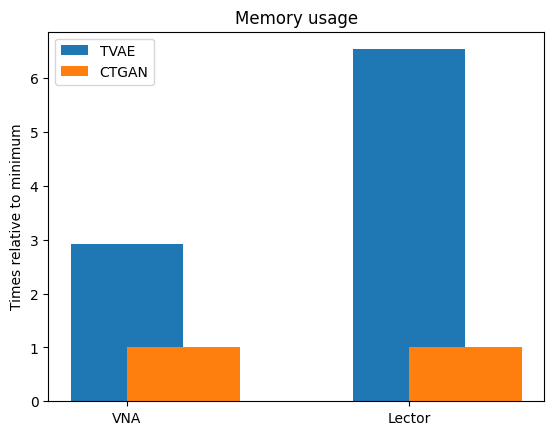

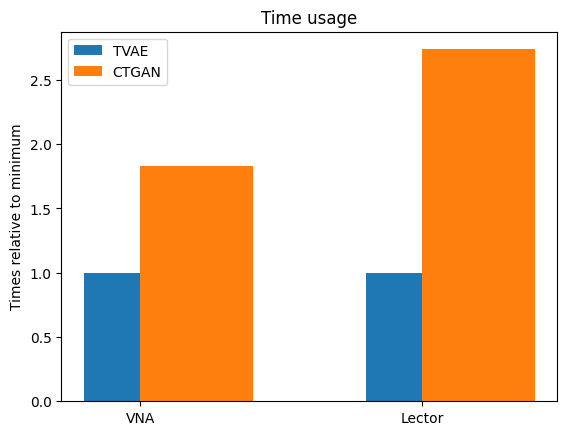

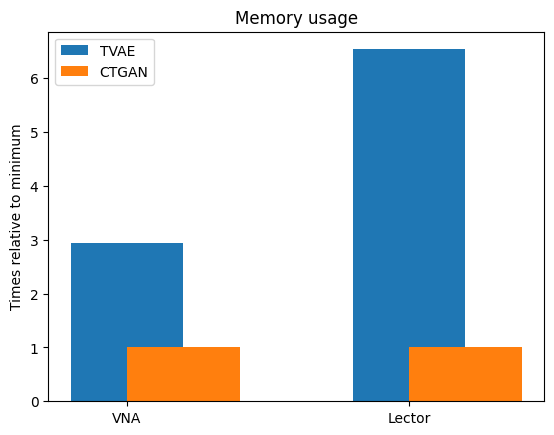

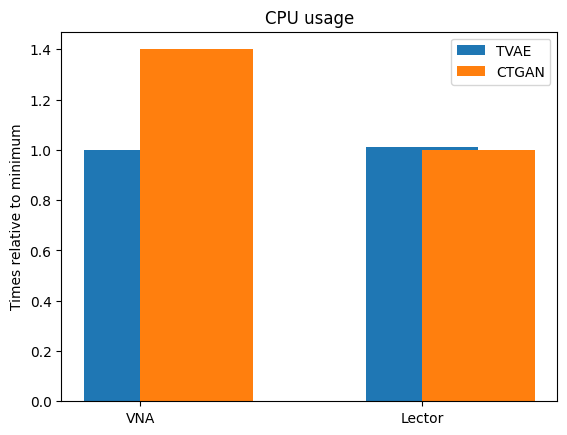

In [12]:
# Crea gráficos
def create_plot(metrics, title):
    labels = list(datasets.keys())
    tvae = [metrics['TVAE'][key] for key in labels]
    ctgan = [metrics['CTGAN'][key] for key in labels]

    x = range(len(labels))

    fig, ax = plt.subplots()

    ax.bar(x, tvae, width=0.4, label='TVAE')
    ax.bar(x, ctgan, width=0.4, label='CTGAN', align='edge')

    ax.set_ylabel('Times relative to minimum')
    ax.set_title(title)
    ax.set_xticks(x)
    ax.set_xticklabels(labels)
    ax.legend()

    plt.show()

create_plot(mem_usage, 'Memory usage')
create_plot(time_usage, 'Time usage')
create_plot(mem_usage_2, 'Memory usage')
create_plot(cpu_usage, 'CPU usage')

### **4. Comparativa de similitud**

In [13]:
def comparativa_similitud (data, metadata):

    model_tvae_comparative = TVAESynthesizer(metadata=metadata)
    model_tvae_comparative.fit(data) 
    new_data_tvae = model_tvae_comparative.sample(num_rows=1000)

    model_ctgan_comparative = CTGANSynthesizer(metadata=metadata)
    model_ctgan_comparative.fit(data) 
    new_data_ctgan = model_ctgan_comparative.sample(num_rows=1000)

    # Carga tus datos
    real_data = data
    synthetic_data_ctgan = new_data_ctgan
    synthetic_data_tvae = new_data_tvae

    # Carga tu metadata
    my_metadata_dict = SingleTableMetadata()
    my_metadata_dict.detect_from_dataframe(data=real_data)
    my_metadata = my_metadata_dict.to_dict()

    # Creamos los informes de calidad
    report_ctgan = QualityReport()
    report_tvae = QualityReport()

    # Generamos los informes
    report_ctgan.generate(real_data, synthetic_data_ctgan, my_metadata)
    report_tvae.generate(real_data, synthetic_data_tvae, my_metadata)

    # Imprimimos los puntajes de calidad generales
    print("\n CTGAN Quality Score: ", report_ctgan.get_score())
    print("\n TVAE Quality Score: ", report_tvae.get_score())

    # Obtén detalles sobre las propiedades
    print("\n CTGAN Properties: ", report_ctgan.get_properties())
    print("\n TVAE Properties: ", report_tvae.get_properties())

    # Genera visualizaciones
    print('############################        CTGAN        ############################')
    fig_ctgan = report_ctgan.get_visualization('Column Shapes')
    fig_ctgan.show()

    fig_ctgan_pair = get_column_pair_plot(
        real_data=real_data,
        synthetic_data=synthetic_data_ctgan,
        column_names=real_data.columns.values,
        metadata=metadata)
        
    fig_ctgan_pair.show()

    print('############################        TVAE        ############################')
    fig_tvae = report_tvae.get_visualization('Column Shapes')
    fig_tvae.show()

    fig_tvae_pair = get_column_pair_plot(
        real_data=real_data,
        synthetic_data=synthetic_data_tvae,
        column_names=real_data.columns.values,
        metadata=metadata)
   
    fig_tvae_pair.show()

In [15]:
comparativa_similitud (data_VNA, my_metadata_VNA_dict)

Creating report: 100%|██████████| 4/4 [00:00<00:00, 78.04it/s]



Overall Quality Score: 71.2%

Properties:
Column Shapes: 80.79%
Column Pair Trends: 61.62%


Creating report: 100%|██████████| 4/4 [00:00<00:00, 107.41it/s]



Overall Quality Score: 88.67%

Properties:
Column Shapes: 91.61%
Column Pair Trends: 85.73%

 CTGAN Quality Score:  0.712049951409067

 TVAE Quality Score:  0.8866869229897306

 CTGAN Properties:               Property     Score
0       Column Shapes  0.807913
1  Column Pair Trends  0.616187

 TVAE Properties:               Property     Score
0       Column Shapes  0.916059
1  Column Pair Trends  0.857315
############################        CTGAN        ############################


############################        TVAE        ############################


In [16]:
comparativa_similitud (data_ER, my_metadata_ER_dict)

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC1'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC2'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC3'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC4'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontif


Overall Quality Score: 85.79%

Properties:
Column Shapes: 84.05%
Column Pair Trends: 87.52%


Creating report: 100%|██████████| 4/4 [00:00<00:00, 26.32it/s]



Overall Quality Score: 93.04%

Properties:
Column Shapes: 93.87%
Column Pair Trends: 92.21%

 CTGAN Quality Score:  0.8578790527342162

 TVAE Quality Score:  0.9303923817930693

 CTGAN Properties:               Property     Score
0       Column Shapes  0.840519
1  Column Pair Trends  0.875239

 TVAE Properties:               Property     Score
0       Column Shapes  0.938716
1  Column Pair Trends  0.922068
############################        CTGAN        ############################


############################        TVAE        ############################


### **5. Comparativa de utilidad**

#### **5.1 Funciones**

In [14]:
def accuracy_confusionMatrix (data_real, data_fake, aggregation, model):

  tipos = data_real.dtypes
  cat_columns = tipos[tipos == object].index
  
  X_real = data_real.drop(columns=cat_columns)
  y_real = data_real['Label']

  if aggregation != 'Original':
    X_fake = data_fake.drop(columns='Label')
    y_fake = data_fake['Label']

  X_train_real, X_test, y_train_real, y_test = train_test_split(X_real,y_real,test_size=0.5)

  if aggregation == 'Original':
    X_train = X_train_real
    y_train = y_train_real
  else:
    X_train = pd.concat([X_train_real,X_fake],axis=0)
    y_train = pd.concat([y_train_real,y_fake],axis=0)

  class_model = SVC(kernel='rbf',C=60000, gamma=0.0000145)
  class_model.fit(X_train,y_train)

  # Predicciones test
  # ==============================================================================
  predicciones = class_model.predict(X_test)

  # Accuracy de test del modelo 
  # ==============================================================================
  accuracy = accuracy_score(
              y_true    = y_test,
              y_pred    = predicciones,
              normalize = True
            )

  confusion_matrix = pd.crosstab(
      y_test.ravel(),
      predicciones,
      rownames=['Real'],
      colnames=['Predicción']
  )

  sns.heatmap(confusion_matrix, square=True, annot=True, fmt='d', cbar=False, linewidths=.5, cmap="YlGnBu")
    # plt.savefig("MC_ER.jpg", dpi=200)
  plt.show()

  if aggregation == 'Original':
    print(f"El accuracy de test de {model} es: {100*accuracy}%")
  else:
    print(f"El accuracy de test de {model} es: {100*accuracy}%")
  
  return confusion_matrix

In [15]:
def accuracy_confusionMatrix_synthetic (data_real, new_data):

  data_real['Nature'] = 'Original'
  new_data['Nature'] = 'Synthetic'
  
  df_total_TVAE = pd.concat([data_real,new_data],axis=0).sample(frac=1) 
  X = df_total_TVAE.drop(columns=['Nature','label']) 
  y = df_total_TVAE['Nature']

  X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.3)
  class_model = SVC(kernel='rbf',C=10000, gamma=0.00145, random_state=123)
  class_model.fit(X_train,y_train) 
  predicciones = class_model.predict(X_test)
  f_s_TVAE = f1_score(y_true = y_test,
                      y_pred = predicciones,
                      average = 'weighted'
                      )

  confusion_matrix = pd.crosstab(
      y_test.ravel(),
      predicciones,
      rownames=['Real'],
      colnames=['Predicción']
  )

  print(f"El F1-score de test es: {100*f_s_TVAE}%")

  return confusion_matrix

In [16]:
def rmse_single (data_real, data_fake, aggregation, model):
  
  tipos = data_real.dtypes
  cat_columns = tipos[tipos == object].index
  
  contador1 = 0

  for alfa in range(20):
    
    ##### Regresion con sinteticos ######

    X_real = data_real.drop(columns=cat_columns)
    y_real = data_real[label_column].map(dict_label_encoding_permitivity)

    if aggregation != 'Original':
      X_fake = data_fake.drop(columns=cat_columns)
      y_fake = data_fake[label_column].map(dict_label_encoding_permitivity)

    X_train_real, X_test, y_train_real, y_test = train_test_split(X_real,y_real,test_size=0.5)

    if aggregation == 'Original':
      X_train = X_train_real
      y_train = y_train_real
    else:
      X_train = pd.concat([X_train_real,X_fake],axis=0)
      y_train = pd.concat([y_train_real,y_fake],axis=0)

    modelo_sum = SVR(kernel='rbf', C=86280, gamma=1.5e-05)
    modelo_sum = modelo_sum.fit(X_train, y_train)
    predicciones = modelo_sum.predict(X_test)
    rmse_s = mean_squared_error(
            y_true  = y_test,
            y_pred  = predicciones,
            squared = False
        )

    contador1 = contador1 + rmse_s

  avg = contador1/21

  if aggregation == 'Original':
    print(f"###########################################################################")
    print(f"El error (rmse) de test con {model} es: {avg}")
    print(f"###########################################################################")
  else:
    print(f"###########################################################################")
    print(f"El error (rmse) de test con {model} es: {avg}")
    print(f"###########################################################################")

  return 

In [17]:
def accuracy_training(data, new_data):
    data['Nature'] = 'Original'
    new_data['Nature'] = 'Synthetic'

    df_total_TVAE = pd.concat([data,new_data],axis=0).sample(frac=1)

    X = df_total_TVAE.drop(columns=['Nature','Label'])
    y = df_total_TVAE['Nature']

    X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.3)

    class_model = SVC(kernel='rbf',C=10000, gamma=0.00145)
    class_model.fit(X_train,y_train)
    predicciones = class_model.predict(X_test)
    f_s_TVAE = f1_score(
            y_true    = y_test,
            y_pred    = predicciones,
            average   ='weighted'
            )
    print("")
    print(f"El accuracy de test es: {100*f_s_TVAE}%")

    # Matriz de confusión de las predicciones de test+
    # ==============================================================================
    confusion_matrix = pd.crosstab(
        y_test.ravel(),
        predicciones,
        rownames=['Real'],
        colnames=['Prediction']
    )

    sns.heatmap(confusion_matrix, square=True, annot=True, fmt='d', cbar=False, linewidths=.5, cmap="YlGnBu")
    # plt.savefig("MC_ER.jpg", dpi=200)
    plt.show()

#### **5.2 Métricas VNA**

In [21]:
model_tvae_comparative = TVAESynthesizer(metadata=my_metadata_VNA_dict)
model_tvae_comparative.fit(data_VNA) 
new_data_tvae_VNA = model_tvae_comparative.sample(num_rows=1000)

model_ctgan_comparative = CTGANSynthesizer(metadata=my_metadata_VNA_dict)
model_ctgan_comparative.fit(data_VNA) 
new_data_ctgan_VNA = model_ctgan_comparative.sample(num_rows=1000)

Matriz de confusión: Original


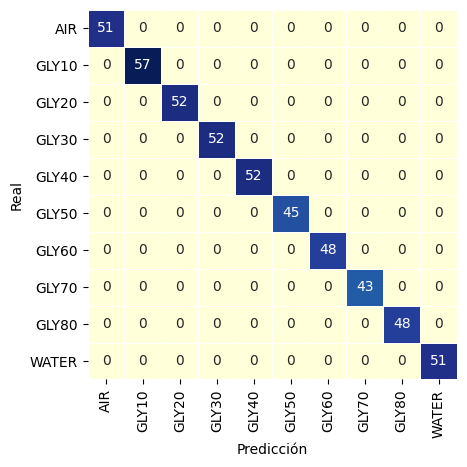

El accuracy de test de Original es: 100.0%


Predicción,AIR,GLY10,GLY20,GLY30,GLY40,GLY50,GLY60,GLY70,GLY80,WATER
Real,,,,,,,,,,
AIR,51,0,0,0,0,0,0,0,0,0
GLY10,0,57,0,0,0,0,0,0,0,0
GLY20,0,0,52,0,0,0,0,0,0,0
GLY30,0,0,0,52,0,0,0,0,0,0
GLY40,0,0,0,0,52,0,0,0,0,0
GLY50,0,0,0,0,0,45,0,0,0,0
GLY60,0,0,0,0,0,0,48,0,0,0
GLY70,0,0,0,0,0,0,0,43,0,0
GLY80,0,0,0,0,0,0,0,0,48,0


In [22]:
print('Matriz de confusión: Original')
accuracy_confusionMatrix (data_VNA, new_data_ctgan_VNA, 'Original', 'Original')

Matriz de confusión: CTGAN


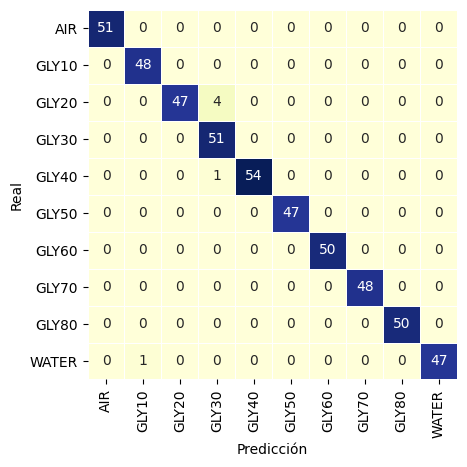

El accuracy de test de CTGAN es: 98.79759519038076%


Predicción,AIR,GLY10,GLY20,GLY30,GLY40,GLY50,GLY60,GLY70,GLY80,WATER
Real,,,,,,,,,,
AIR,51,0,0,0,0,0,0,0,0,0
GLY10,0,48,0,0,0,0,0,0,0,0
GLY20,0,0,47,4,0,0,0,0,0,0
GLY30,0,0,0,51,0,0,0,0,0,0
GLY40,0,0,0,1,54,0,0,0,0,0
GLY50,0,0,0,0,0,47,0,0,0,0
GLY60,0,0,0,0,0,0,50,0,0,0
GLY70,0,0,0,0,0,0,0,48,0,0
GLY80,0,0,0,0,0,0,0,0,50,0


In [23]:
print('Matriz de confusión: CTGAN')
accuracy_confusionMatrix (data_VNA, new_data_ctgan_VNA, 'CTGAN', 'CTGAN')

Matriz de confusión: TVAE


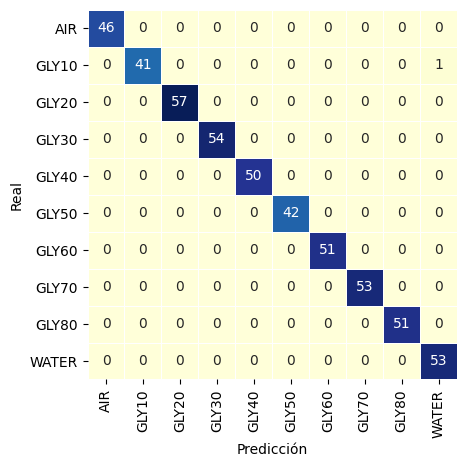

El accuracy de test de TVAE es: 99.79959919839679%


Predicción,AIR,GLY10,GLY20,GLY30,GLY40,GLY50,GLY60,GLY70,GLY80,WATER
Real,,,,,,,,,,
AIR,46,0,0,0,0,0,0,0,0,0
GLY10,0,41,0,0,0,0,0,0,0,1
GLY20,0,0,57,0,0,0,0,0,0,0
GLY30,0,0,0,54,0,0,0,0,0,0
GLY40,0,0,0,0,50,0,0,0,0,0
GLY50,0,0,0,0,0,42,0,0,0,0
GLY60,0,0,0,0,0,0,51,0,0,0
GLY70,0,0,0,0,0,0,0,53,0,0
GLY80,0,0,0,0,0,0,0,0,51,0


In [24]:
print('Matriz de confusión: TVAE')
accuracy_confusionMatrix (data_VNA, new_data_tvae_VNA, 'TVAE', 'TVAE')

In [25]:
rmse_single (data_VNA, data_VNA, 'Original', 'Original')

###########################################################################
El error (rmse) de test con Original es: 0.9678661597047774
###########################################################################


In [26]:
rmse_single (data_VNA, new_data_tvae_VNA, 'TVAE', 'TVAE')

###########################################################################
El error (rmse) de test con TVAE es: 1.0270088495937872
###########################################################################


In [27]:
rmse_single (data_VNA, new_data_ctgan_VNA, 'CTGAN', 'CTGAN')

###########################################################################
El error (rmse) de test con CTGAN es: 3.706217472713778
###########################################################################


#### **5.3 Métricas ER**

In [28]:
model_tvae_comparative = TVAESynthesizer(metadata=my_metadata_ER_dict)
model_tvae_comparative.fit(data_ER) 
new_data_tvae_ER = model_tvae_comparative.sample(num_rows=1000)

model_ctgan_comparative = CTGANSynthesizer(metadata=my_metadata_ER_dict)
model_ctgan_comparative.fit(data_ER) 
new_data_ctgan_ER = model_ctgan_comparative.sample(num_rows=1000)

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC1'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC2'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC3'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC4'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontif

Matriz de confusión: Original


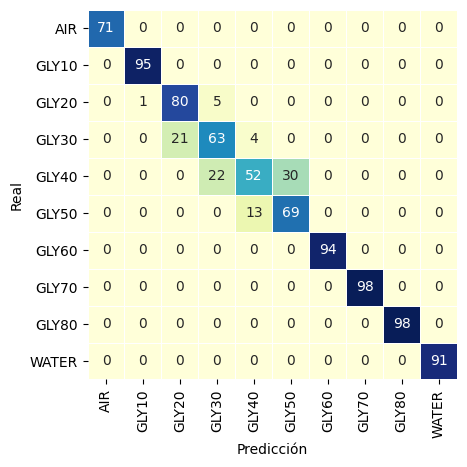

El accuracy de test de Original es: 89.41565600882029%


Predicción,AIR,GLY10,GLY20,GLY30,GLY40,GLY50,GLY60,GLY70,GLY80,WATER
Real,,,,,,,,,,
AIR,71,0,0,0,0,0,0,0,0,0
GLY10,0,95,0,0,0,0,0,0,0,0
GLY20,0,1,80,5,0,0,0,0,0,0
GLY30,0,0,21,63,4,0,0,0,0,0
GLY40,0,0,0,22,52,30,0,0,0,0
GLY50,0,0,0,0,13,69,0,0,0,0
GLY60,0,0,0,0,0,0,94,0,0,0
GLY70,0,0,0,0,0,0,0,98,0,0
GLY80,0,0,0,0,0,0,0,0,98,0


In [29]:
print('Matriz de confusión: Original')
accuracy_confusionMatrix (data_ER, new_data_ctgan_ER, 'Original', 'Original')

Matriz de confusión: CTGAN


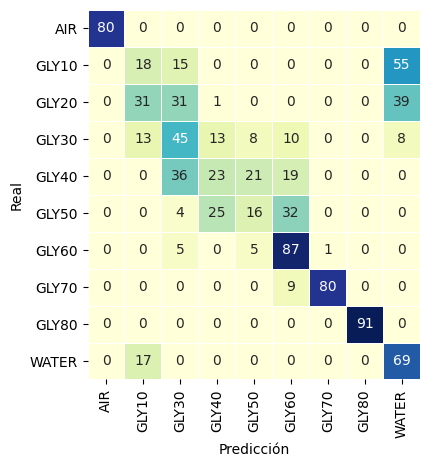

El accuracy de test de CTGAN es: 56.119073869900774%


Predicción,AIR,GLY10,GLY30,GLY40,GLY50,GLY60,GLY70,GLY80,WATER
Real,,,,,,,,,
AIR,80,0,0,0,0,0,0,0,0
GLY10,0,18,15,0,0,0,0,0,55
GLY20,0,31,31,1,0,0,0,0,39
GLY30,0,13,45,13,8,10,0,0,8
GLY40,0,0,36,23,21,19,0,0,0
GLY50,0,0,4,25,16,32,0,0,0
GLY60,0,0,5,0,5,87,1,0,0
GLY70,0,0,0,0,0,9,80,0,0
GLY80,0,0,0,0,0,0,0,91,0


In [30]:
print('Matriz de confusión: CTGAN')
accuracy_confusionMatrix (data_ER, new_data_ctgan_ER, 'TVAE', 'CTGAN')

Matriz de confusión: TVAE


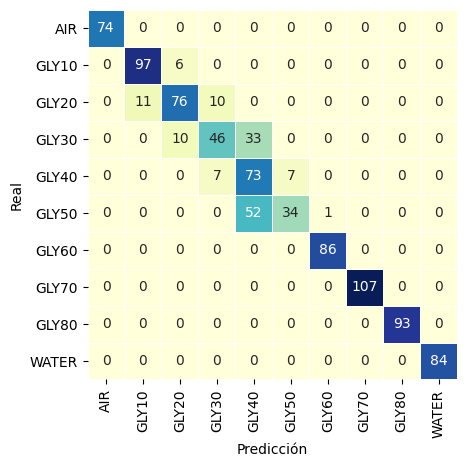

El accuracy de test de TVAE es: 84.89525909592062%


Predicción,AIR,GLY10,GLY20,GLY30,GLY40,GLY50,GLY60,GLY70,GLY80,WATER
Real,,,,,,,,,,
AIR,74,0,0,0,0,0,0,0,0,0
GLY10,0,97,6,0,0,0,0,0,0,0
GLY20,0,11,76,10,0,0,0,0,0,0
GLY30,0,0,10,46,33,0,0,0,0,0
GLY40,0,0,0,7,73,7,0,0,0,0
GLY50,0,0,0,0,52,34,1,0,0,0
GLY60,0,0,0,0,0,0,86,0,0,0
GLY70,0,0,0,0,0,0,0,107,0,0
GLY80,0,0,0,0,0,0,0,0,93,0


In [31]:
print('Matriz de confusión: TVAE')
accuracy_confusionMatrix (data_ER, new_data_tvae_ER, 'TVAE', 'TVAE')

In [32]:
rmse_single (data_ER, data_ER, 'Original', 'Original')

###########################################################################
El error (rmse) de test con Original es: 2.1002343333732685
###########################################################################


In [33]:
rmse_single (data_ER, new_data_tvae_ER, 'TVAE', 'TVAE')

###########################################################################
El error (rmse) de test con TVAE es: 4.148403509778761
###########################################################################


In [34]:
rmse_single (data_ER, new_data_ctgan_ER, 'CTGAN', 'CTGAN')

###########################################################################
El error (rmse) de test con CTGAN es: 8.157413950093705
###########################################################################


### **FUNCIONES**

In [18]:
def entrenamiento_modelos_invidual_all (dataset,my_metadata_dict, model_evaluated,dict_data_products,
                                        mem_usage,time_usage,disk_usage,cpu_usage):
    
    real_data_separated  = pd.DataFrame()
    fake_data_separated = pd.DataFrame()

    my_metadata = my_metadata_dict.to_dict()

    start_time = time.time()
    mem_before = memory_usage(-1, interval=0.1, timeout=1)[0]
    start_memory = get_memory_footprint()
    start_cpu = get_cpu_usage()
    
    for product in substances:
        print("---------------------------------------------------")
        print("Substance:" + product)

        if product == "ALL": 
            end_time = time.time()
            mem_after = memory_usage(-1, interval=0.1, timeout=1)[0]
            end_memory = get_memory_footprint()
            end_cpu = get_cpu_usage()

            # Guarda las métricas
            mem_usage['Separated'][dataset] = mem_after - mem_before
            time_usage['Separated'][dataset] = end_time - start_time
            disk_usage['Separated'][dataset] = end_memory - start_memory
            cpu_usage['Separated'][dataset] = end_cpu - start_cpu

            start_time = time.time()
            mem_before = memory_usage(-1, interval=0.1, timeout=1)[0]
            start_memory = get_memory_footprint()
            start_cpu = get_cpu_usage()

        model_evaluated.fit(dict_data_products[product])
        
        new_data = model_evaluated.sample(num_rows=len(dict_data_products[product])*5)
        
        if product == "ALL":
            real_data_all  = dict_data_products[product]
            fake_data_all  = new_data
        else:
            new_data[label_column]= product
            real_data_separated  = pd.concat([real_data_separated ,dict_data_products[product]],axis=0)
            fake_data_separated  = pd.concat([fake_data_separated ,new_data ],axis=0)
        
        # Creamos los informes de calidad
        report_tvae_iterative  = QualityReport()

        # Generamos los informes
        print('---------- Model evaluation:   \n')
        report_tvae_iterative .generate(dict_data_products[product], new_data , my_metadata)
        print("---------------------------------------------------")

    end_time = time.time()
    mem_after = memory_usage(-1, interval=0.1, timeout=1)[0]
    end_memory = get_memory_footprint()
    end_cpu = get_cpu_usage()

    # Guarda las métricas
    mem_usage['ALL'][dataset] = mem_after - mem_before
    time_usage['ALL'][dataset] = end_time - start_time
    disk_usage['ALL'][dataset] = end_memory - start_memory
    cpu_usage['ALL'][dataset] = end_cpu - start_cpu

    print("\n --- TVAE:   %s seconds ---" % (end_time - start_time))
    report_sep = QualityReport()
    report_all = QualityReport()
    print('\n ---------- Model evaluation (SEPARATED):   ')
    report_sep.generate(real_data_separated, fake_data_separated, my_metadata)
    print('\n ---------- Model evaluation (ALL):   ')
    report_all.generate(real_data_all, fake_data_all, my_metadata)

    real_data_separated['Nature'] = 'Original'
    fake_data_separated['Nature'] = 'Fake'

    real_data_all['Nature'] = 'Original'
    fake_data_all['Nature'] = 'Fake'

    return real_data_separated, fake_data_separated, real_data_all, fake_data_all, mem_usage, time_usage, disk_usage, cpu_usage

In [19]:
def analisis_modelos_invidual_all (real_data_separated, fake_data_separated,data_separated,
                                    real_data_all, fake_data_all,data_all):
    
    print('\n################################################################################################')
    print('################################ SEPARATED: Gráfico de dispersión ################################')
    print('################################################################################################\n')
    fig = px.scatter(data_separated, x='PC1', y='PC2', color=label_column, color_discrete_map = dict_label_color)
    fig.show()

    fig = px.scatter(fake_data_separated , x='PC1', y='PC2', color=label_column, color_discrete_map = dict_label_color)
    fig.show()

    print('\n################################################################################################')
    print('################################## ALL: Gráfico de dispersión ####################################')
    print('##################################################################################################\n')
    fig = px.scatter(data_all , x='PC1', y='PC2', color=label_column, color_discrete_map = dict_label_color)
    fig.show()

    fig = px.scatter(fake_data_all, x='PC1', y='PC2', color=label_column, color_discrete_map = dict_label_color)
    fig.show()
    
    print('\n################################################################################################')
    print('#################################### ALL: Matriz de confusión ####################################')
    print('#################################################################################################\n')
    accuracy_confusionMatrix (real_data_all.drop(columns='Nature'),fake_data_all.drop(columns='Nature'), 'ALL', 'ALL')
    
    print('\n################################################################################################')
    print('################################# SEPARATED: Matriz de confusión #################################')
    print('#################################################################################################\n')
    accuracy_confusionMatrix (real_data_separated.drop(columns='Nature'),fake_data_separated.drop(columns='Nature'), 'SEPARATE', 'SEPARATE')

    print('\n#################################################################################')
    print('#################################### ALL: RMSE ####################################')
    print('###################################################################################\n')
    rmse_single(real_data_all.drop(columns='Nature'),fake_data_all.drop(columns='Nature'), 'ALL', 'ALL')

    print('\n#################################################################################')
    print('################################# SEPARATED: RMSE #################################')
    print('##################################################################################\n')
    rmse_single(real_data_separated.drop(columns='Nature'),fake_data_separated.drop(columns='Nature'), 'SEPARATED', 'SEPARATED')

In [20]:
# Crea gráficos
def create_plot_separate(metrics, title):
    labels = list(['VNA','VNA_Optimized','Lector','Lector_Optimized'])
    separated = [metrics['Separated'][key] for key in labels]
    all = [metrics['ALL'][key] for key in labels]

    x = range(len(labels))

    fig, ax = plt.subplots()

    ax.bar(x, separated, width=0.4, label='Individual')
    ax.bar(x, all, width=0.4, label='All', align='edge')

    ax.set_ylabel('Times relative to minimum')
    ax.set_title(title)
    ax.set_xticks(x)
    ax.set_xticklabels(labels)
    ax.legend()

    plt.show()

In [38]:
# Diccionarios para almacenar las métricas
mem_usage_TVAE = {'Separated': {}, 'ALL': {}}
time_usage_TVAE = {'Separated': {}, 'ALL': {}}
disk_usage_TVAE = {'Separated': {}, 'ALL': {}}
cpu_usage_TVAE = {'Separated': {}, 'ALL': {}}

### **6. TVAE: Entrenamiento agrupado e individual VNA**

#### **6.1. Entrenamiento Optimized**

In [66]:
real_data_separated_TVAE_opt_VNA  = pd.DataFrame()
fake_data_separated_TVAE_opt_VNA = pd.DataFrame()
real_data_all_TVAE_opt_VNA  = pd.DataFrame()
fake_data_all_TVAE_opt_VNA = pd.DataFrame()

In [74]:
results_TVAE_opt_VNA = [real_data_separated_TVAE_opt_VNA, 
                fake_data_separated_TVAE_opt_VNA, 
                real_data_all_TVAE_opt_VNA, 
                fake_data_all_TVAE_opt_VNA, 
                mem_usage_TVAE, 
                time_usage_TVAE, 
                disk_usage_TVAE, 
                cpu_usage_TVAE]

model_TVAE_optimized_VNA  = TVAESynthesizer(metadata=my_metadata_VNA_dict,
                                            epochs=1000, 
                                            batch_size=10, 
                                            loss_factor=1.34, 
                                            l2scale=0.0002978, 
                                            embedding_dim=40,
                                            compress_dims=(221,253,116),
                                            decompress_dims=(116,253,221))

results_TVAE_opt_VNA = entrenamiento_modelos_invidual_all ('VNA_Optimized',my_metadata_VNA_dict,
                                                model_TVAE_optimized_VNA,
                                                dict_data_products_VNA,
                                                mem_usage_TVAE,
                                                time_usage_TVAE,
                                                disk_usage_TVAE,
                                                cpu_usage_TVAE)


real_data_separated_TVAE_opt_VNA  = results_TVAE_opt_VNA[0]
fake_data_separated_TVAE_opt_VNA = results_TVAE_opt_VNA[1]
real_data_all_TVAE_opt_VNA  = results_TVAE_opt_VNA[2]
fake_data_all_TVAE_opt_VNA = results_TVAE_opt_VNA[3]
mem_usage_TVAE = results_TVAE_opt_VNA[4]
time_usage_TVAE = results_TVAE_opt_VNA[5]
disk_usage_TVAE = results_TVAE_opt_VNA[6]
cpu_usage_TVAE = results_TVAE_opt_VNA[7]

data_separated_TVAE_opt_VNA = pd.concat([real_data_separated_TVAE_opt_VNA ,fake_data_separated_TVAE_opt_VNA ],axis=0).sample(frac=1)
data_all_TVAE_opt_VNA  = pd.concat([real_data_all_TVAE_opt_VNA ,fake_data_all_TVAE_opt_VNA ],axis=0).sample(frac=1)
                                                                                                             

---------------------------------------------------
Substance:WATER
---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 162.71it/s]


Overall Quality Score: 93.72%

Properties:
Column Shapes: 95.3%
Column Pair Trends: 92.14%
---------------------------------------------------
---------------------------------------------------
Substance:GLY70


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 149.83it/s]


Overall Quality Score: 92.17%

Properties:
Column Shapes: 92.55%
Column Pair Trends: 91.78%
---------------------------------------------------
---------------------------------------------------
Substance:GLY60


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 156.47it/s]


Overall Quality Score: 95.1%

Properties:
Column Shapes: 95.85%
Column Pair Trends: 94.35%
---------------------------------------------------
---------------------------------------------------
Substance:GLY50


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 144.64it/s]


Overall Quality Score: 92.66%

Properties:
Column Shapes: 94.0%
Column Pair Trends: 91.33%
---------------------------------------------------
---------------------------------------------------
Substance:GLY10


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 122.71it/s]


Overall Quality Score: 94.56%

Properties:
Column Shapes: 95.2%
Column Pair Trends: 93.93%
---------------------------------------------------
---------------------------------------------------
Substance:GLY30


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 122.52it/s]


Overall Quality Score: 93.34%

Properties:
Column Shapes: 93.55%
Column Pair Trends: 93.13%
---------------------------------------------------
---------------------------------------------------
Substance:GLY40


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 104.89it/s]


Overall Quality Score: 93.77%

Properties:
Column Shapes: 94.0%
Column Pair Trends: 93.53%
---------------------------------------------------
---------------------------------------------------
Substance:GLY80


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 112.35it/s]


Overall Quality Score: 92.89%

Properties:
Column Shapes: 93.95%
Column Pair Trends: 91.82%
---------------------------------------------------
---------------------------------------------------
Substance:AIR


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 115.63it/s]


Overall Quality Score: 94.45%

Properties:
Column Shapes: 95.15%
Column Pair Trends: 93.75%
---------------------------------------------------
---------------------------------------------------
Substance:GLY20


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 126.64it/s]


Overall Quality Score: 95.76%

Properties:
Column Shapes: 96.25%
Column Pair Trends: 95.27%
---------------------------------------------------
---------------------------------------------------
Substance:ALL


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 89.52it/s]


Overall Quality Score: 94.95%

Properties:
Column Shapes: 96.59%
Column Pair Trends: 93.31%
---------------------------------------------------



 --- TVAE:   884.9953670501709 seconds ---

 ---------- Model evaluation (SEPARATED):   


Creating report: 100%|██████████| 4/4 [00:00<00:00, 88.39it/s]



Overall Quality Score: 98.54%

Properties:
Column Shapes: 98.85%
Column Pair Trends: 98.24%

 ---------- Model evaluation (ALL):   


Creating report: 100%|██████████| 4/4 [00:00<00:00, 66.26it/s]


Overall Quality Score: 94.95%



Properties:
Column Shapes: 96.59%
Column Pair Trends: 93.31%


In [75]:
real_data_separated_TVAE_opt_VNA.to_csv(save_folder+'real_data_separated_TVAE_opt_VNA.csv', index=False)
fake_data_separated_TVAE_opt_VNA.to_csv(save_folder+'fake_data_separated_TVAE_opt_VNA.csv', index=False)
data_separated_TVAE_opt_VNA.to_csv(save_folder+'data_separated_TVAE_opt_VNA.csv', index=False)


real_data_all_TVAE_opt_VNA.to_csv(save_folder+'real_data_all_TVAE_opt_VNA.csv', index=False)
fake_data_all_TVAE_opt_VNA.to_csv(save_folder+'fake_data_all_TVAE_opt_VNA.csv', index=False)
data_all_TVAE_opt_VNA.to_csv(save_folder+'data_all_TVAE_opt_VNA.csv', index=False)

#### **6.2. Análisis Optimized**


################################################################################################
################################ SEPARATED: Gráfico de dispersión ################################
################################################################################################




################################################################################################
################################## ALL: Gráfico de dispersión ####################################
##################################################################################################




################################################################################################
#################################### ALL: Matriz de confusión ####################################
#################################################################################################



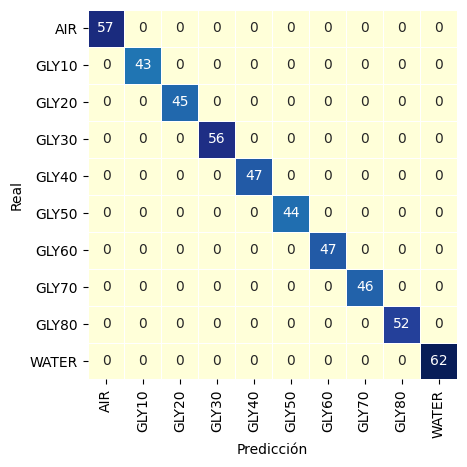

El accuracy de test de ALL es: 100.0%

################################################################################################
################################# SEPARATED: Matriz de confusión #################################
#################################################################################################



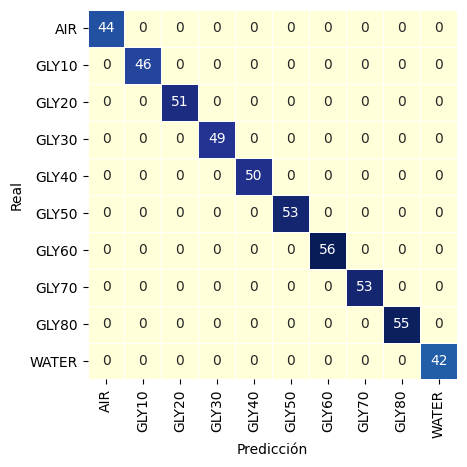

El accuracy de test de SEPARATE es: 100.0%

#################################################################################
#################################### ALL: RMSE ####################################
###################################################################################

###########################################################################
El error (rmse) de test con ALL es: 0.9137374509164486
###########################################################################

#################################################################################
################################# SEPARATED: RMSE #################################
##################################################################################

###########################################################################
El error (rmse) de test con SEPARATED es: 0.8272031666582664
###########################################################################


In [76]:
analisis_modelos_invidual_all (real_data_separated_TVAE_opt_VNA, fake_data_separated_TVAE_opt_VNA,data_separated_TVAE_opt_VNA,
                                    real_data_all_TVAE_opt_VNA, fake_data_all_TVAE_opt_VNA,data_all_TVAE_opt_VNA)

#### **6.3. Entrenamiento Non-Optimized**

In [79]:
data_VNA = pd.read_csv("PCA_GLY.csv", header=0, index_col=0)
data_VNA = data_VNA.rename(columns={'label': 'Label'})

my_metadata_VNA_dict = SingleTableMetadata()
my_metadata_VNA_dict.detect_from_dataframe(data=data_VNA)

dict_data_products_VNA = {}

for product in substances:
    if product == "ALL":
      dict_data_products_VNA["ALL"] = data_VNA
    else:
      dict_data_products_VNA[product] = data_VNA[data_VNA[label_column]==product]


In [80]:
real_data_separated_TVAE_VNA  = pd.DataFrame()
fake_data_separated_TVAE_VNA = pd.DataFrame()
real_data_all_TVAE_VNA  = pd.DataFrame()
fake_data_all_TVAE_VNA = pd.DataFrame()

In [81]:
results_TVAE_VNA = [real_data_separated_TVAE_VNA, 
                fake_data_separated_TVAE_VNA, 
                real_data_all_TVAE_VNA, 
                fake_data_all_TVAE_VNA, 
                mem_usage_TVAE, 
                time_usage_TVAE, 
                disk_usage_TVAE, 
                cpu_usage_TVAE]

model_TVAE_VNA  = TVAESynthesizer(metadata=my_metadata_VNA_dict)

results_TVAE_VNA = entrenamiento_modelos_invidual_all ('VNA',my_metadata_VNA_dict,
                                                model_TVAE_VNA,
                                                dict_data_products_VNA,
                                                mem_usage_TVAE,
                                                time_usage_TVAE,
                                                disk_usage_TVAE,
                                                cpu_usage_TVAE)


real_data_separated_TVAE_VNA  = results_TVAE_VNA[0]
fake_data_separated_TVAE_VNA = results_TVAE_VNA[1]
real_data_all_TVAE_VNA  = results_TVAE_VNA[2]
fake_data_all_TVAE_VNA = results_TVAE_VNA[3]
mem_usage_TVAE = results_TVAE_VNA[4]
time_usage_TVAE = results_TVAE_VNA[5]
disk_usage_TVAE = results_TVAE_VNA[6]
cpu_usage_TVAE = results_TVAE_VNA[7]


data_separated_TVAE_VNA = pd.concat([real_data_separated_TVAE_VNA ,fake_data_separated_TVAE_VNA ],axis=0).sample(frac=1)
data_all_TVAE_VNA  = pd.concat([real_data_all_TVAE_VNA ,fake_data_all_TVAE_VNA ],axis=0).sample(frac=1)

---------------------------------------------------
Substance:WATER
---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 189.25it/s]


Overall Quality Score: 88.41%

Properties:
Column Shapes: 90.05%
Column Pair Trends: 86.77%
---------------------------------------------------
---------------------------------------------------
Substance:GLY70


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 153.13it/s]


Overall Quality Score: 88.35%

Properties:
Column Shapes: 91.7%
Column Pair Trends: 85.0%
---------------------------------------------------
---------------------------------------------------
Substance:GLY60


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 156.24it/s]


Overall Quality Score: 90.12%

Properties:
Column Shapes: 91.7%
Column Pair Trends: 88.55%
---------------------------------------------------
---------------------------------------------------
Substance:GLY50


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 157.84it/s]


Overall Quality Score: 87.19%

Properties:
Column Shapes: 92.4%
Column Pair Trends: 81.98%
---------------------------------------------------
---------------------------------------------------
Substance:GLY10


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 147.89it/s]


Overall Quality Score: 82.53%

Properties:
Column Shapes: 86.75%
Column Pair Trends: 78.32%
---------------------------------------------------
---------------------------------------------------
Substance:GLY30


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 181.39it/s]


Overall Quality Score: 85.21%

Properties:
Column Shapes: 90.6%
Column Pair Trends: 79.82%
---------------------------------------------------
---------------------------------------------------
Substance:GLY40


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 189.85it/s]


Overall Quality Score: 85.9%

Properties:
Column Shapes: 90.65%
Column Pair Trends: 81.15%
---------------------------------------------------
---------------------------------------------------
Substance:GLY80


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 162.23it/s]


Overall Quality Score: 88.76%

Properties:
Column Shapes: 91.0%
Column Pair Trends: 86.52%
---------------------------------------------------
---------------------------------------------------
Substance:AIR


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 165.71it/s]


Overall Quality Score: 88.65%

Properties:
Column Shapes: 91.63%
Column Pair Trends: 85.67%
---------------------------------------------------
---------------------------------------------------
Substance:GLY20


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 173.57it/s]


Overall Quality Score: 85.97%

Properties:
Column Shapes: 91.45%
Column Pair Trends: 80.5%
---------------------------------------------------
---------------------------------------------------
Substance:ALL


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 94.83it/s]


Overall Quality Score: 89.37%

Properties:
Column Shapes: 93.06%
Column Pair Trends: 85.68%
---------------------------------------------------



 --- TVAE:   19.684216499328613 seconds ---

 ---------- Model evaluation (SEPARATED):   


Creating report: 100%|██████████| 4/4 [00:00<00:00, 108.49it/s]



Overall Quality Score: 96.93%

Properties:
Column Shapes: 97.94%
Column Pair Trends: 95.92%

 ---------- Model evaluation (ALL):   


Creating report: 100%|██████████| 4/4 [00:00<00:00, 76.63it/s]


Overall Quality Score: 89.37%

Properties:
Column Shapes: 93.06%
Column Pair Trends: 85.68%


In [82]:
real_data_separated_TVAE_VNA.to_csv(save_folder+'real_data_separated_TVAE_VNA.csv', index=False)
fake_data_separated_TVAE_VNA.to_csv(save_folder+'fake_data_separated_TVAE_VNA.csv', index=False)
data_separated_TVAE_VNA.to_csv(save_folder+'data_separated_TVAE_VNA.csv', index=False)


real_data_all_TVAE_VNA.to_csv(save_folder+'real_data_all_TVAE_VNA.csv', index=False)
fake_data_all_TVAE_VNA.to_csv(save_folder+'fake_data_all_TVAE_VNA.csv', index=False)
data_all_TVAE_VNA.to_csv(save_folder+'data_all_TVAE_VNA.csv', index=False)

#### **6.4. Análisis Non-Optimized**


################################################################################################
################################ SEPARATED: Gráfico de dispersión ################################
################################################################################################




################################################################################################
################################## ALL: Gráfico de dispersión ####################################
##################################################################################################




################################################################################################
#################################### ALL: Matriz de confusión ####################################
#################################################################################################



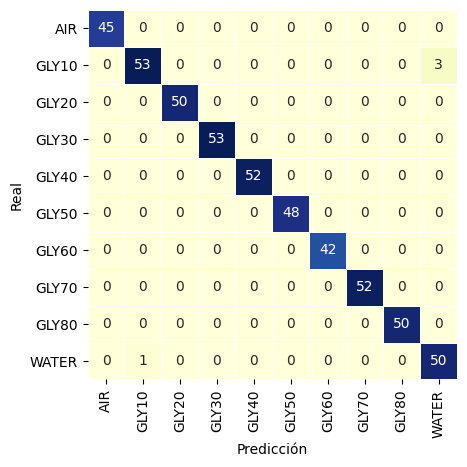

El accuracy de test de ALL es: 99.19839679358718%

################################################################################################
################################# SEPARATED: Matriz de confusión #################################
#################################################################################################



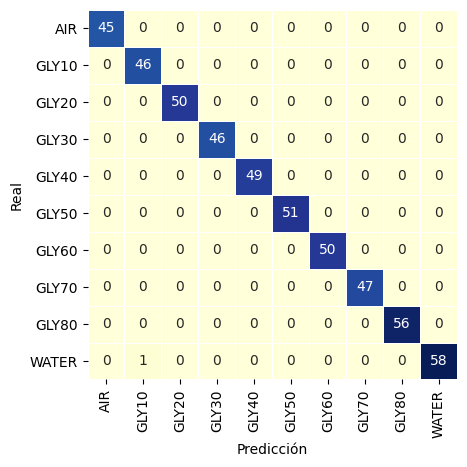

El accuracy de test de SEPARATE es: 99.79959919839679%

#################################################################################
#################################### ALL: RMSE ####################################
###################################################################################

###########################################################################
El error (rmse) de test con ALL es: 1.0547322901723581
###########################################################################

#################################################################################
################################# SEPARATED: RMSE #################################
##################################################################################

###########################################################################
El error (rmse) de test con SEPARATED es: 0.9555493993711549
###########################################################################


In [84]:
analisis_modelos_invidual_all (real_data_separated_TVAE_VNA, fake_data_separated_TVAE_VNA,data_separated_TVAE_VNA,
                                    real_data_all_TVAE_VNA, fake_data_all_TVAE_VNA,data_all_TVAE_VNA)

### **7. TVAE: Entrenamiento agrupado e individual ER**

#### **7.1. Entrenamiento Optimized**

In [88]:
data_ER = pd.read_csv("PCA_GLY_ER.csv", header=0, index_col=0)
data_ER = data_ER.drop(columns = 'Set')

my_metadata_ER_dict = SingleTableMetadata()
my_metadata_ER_dict.detect_from_dataframe(data=data_ER)

dict_data_products_ER = {}

for product in substances:
    if product == "ALL":
      dict_data_products_ER["ALL"] = data_ER
    else:
      dict_data_products_ER[product] = data_ER[data_ER[label_column]==product]

In [89]:
real_data_separated_TVAE_opt_ER  = pd.DataFrame()
fake_data_separated_TVAE_opt_ER = pd.DataFrame()
real_data_all_TVAE_opt_ER  = pd.DataFrame()
fake_data_all_TVAE_opt_ER = pd.DataFrame()

In [91]:
results_TVAE_opt_ER = [real_data_separated_TVAE_opt_ER, 
                fake_data_separated_TVAE_opt_ER, 
                real_data_all_TVAE_opt_ER, 
                fake_data_all_TVAE_opt_ER, 
                mem_usage_TVAE, 
                time_usage_TVAE, 
                disk_usage_TVAE, 
                cpu_usage_TVAE]

model_TVAE_optimized_ER  = TVAESynthesizer(metadata=my_metadata_ER_dict,
                                            epochs=1000, 
                                            batch_size=10, 
                                            loss_factor=1.34, 
                                            l2scale=0.0002978, 
                                            embedding_dim=40,
                                            compress_dims=(221,253,116),
                                            decompress_dims=(116,253,221))

results_TVAE_opt_ER = entrenamiento_modelos_invidual_all ('Lector_Optimized',my_metadata_ER_dict,
                                                model_TVAE_optimized_ER,
                                                dict_data_products_ER,
                                                mem_usage_TVAE,
                                                time_usage_TVAE,
                                                disk_usage_TVAE,
                                                cpu_usage_TVAE)

real_data_separated_TVAE_opt_ER  = results_TVAE_opt_ER[0]
fake_data_separated_TVAE_opt_ER = results_TVAE_opt_ER[1]
real_data_all_TVAE_opt_ER  = results_TVAE_opt_ER[2]
fake_data_all_TVAE_opt_ER = results_TVAE_opt_ER[3]
mem_usage_TVAE = results_TVAE_opt_ER[4]
time_usage_TVAE = results_TVAE_opt_ER[5]
disk_usage_TVAE = results_TVAE_opt_ER[6]
cpu_usage_TVAE = results_TVAE_opt_ER[7]

data_separated_TVAE_opt_ER = pd.concat([real_data_separated_TVAE_opt_ER ,fake_data_separated_TVAE_opt_ER ],axis=0).sample(frac=1)
data_all_TVAE_opt_ER = pd.concat([real_data_all_TVAE_opt_ER ,fake_data_all_TVAE_opt_ER ],axis=0).sample(frac=1)

---------------------------------------------------
Substance:WATER


c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC1'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC2'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC3'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC4'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontif

---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 27.90it/s]
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC1'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC2'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC3'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC4'. Data wil


Overall Quality Score: 94.72%

Properties:
Column Shapes: 93.81%
Column Pair Trends: 95.63%
---------------------------------------------------
---------------------------------------------------
Substance:GLY70
---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 25.55it/s]
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC1'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC2'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC3'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC4'. Data wil


Overall Quality Score: 94.89%

Properties:
Column Shapes: 94.52%
Column Pair Trends: 95.26%
---------------------------------------------------
---------------------------------------------------
Substance:GLY60
---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 27.05it/s]
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC1'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC2'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC3'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC4'. Data wil


Overall Quality Score: 94.73%

Properties:
Column Shapes: 93.89%
Column Pair Trends: 95.57%
---------------------------------------------------
---------------------------------------------------
Substance:GLY50
---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 22.23it/s]
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC1'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC2'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC3'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC4'. Data wil


Overall Quality Score: 94.36%

Properties:
Column Shapes: 93.76%
Column Pair Trends: 94.97%
---------------------------------------------------
---------------------------------------------------
Substance:GLY10
---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 21.64it/s]
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC1'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC2'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC3'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC4'. Data wil


Overall Quality Score: 94.64%

Properties:
Column Shapes: 93.87%
Column Pair Trends: 95.41%
---------------------------------------------------
---------------------------------------------------
Substance:GLY30
---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 23.42it/s]
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC1'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC2'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC3'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC4'. Data wil


Overall Quality Score: 93.27%

Properties:
Column Shapes: 91.92%
Column Pair Trends: 94.62%
---------------------------------------------------
---------------------------------------------------
Substance:GLY40
---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 20.86it/s]
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC1'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC2'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC3'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC4'. Data wil


Overall Quality Score: 94.69%

Properties:
Column Shapes: 94.07%
Column Pair Trends: 95.31%
---------------------------------------------------
---------------------------------------------------
Substance:GLY80
---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 21.74it/s]
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC1'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC2'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC3'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC4'. Data wil


Overall Quality Score: 95.37%

Properties:
Column Shapes: 95.0%
Column Pair Trends: 95.74%
---------------------------------------------------
---------------------------------------------------
Substance:AIR
---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 25.25it/s]
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC1'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC2'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC3'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC4'. Data wil


Overall Quality Score: 95.17%

Properties:
Column Shapes: 94.14%
Column Pair Trends: 96.19%
---------------------------------------------------
---------------------------------------------------
Substance:GLY20
---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 26.49it/s]



Overall Quality Score: 95.16%

Properties:
Column Shapes: 94.46%
Column Pair Trends: 95.85%
---------------------------------------------------
---------------------------------------------------
Substance:ALL


c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC1'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC2'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC3'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC4'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontif

---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 18.50it/s]



Overall Quality Score: 94.85%

Properties:
Column Shapes: 95.63%
Column Pair Trends: 94.07%
---------------------------------------------------

 --- TVAE:   1860.2374160289764 seconds ---

 ---------- Model evaluation (SEPARATED):   


Creating report: 100%|██████████| 4/4 [00:00<00:00, 18.87it/s]



Overall Quality Score: 97.66%

Properties:
Column Shapes: 98.16%
Column Pair Trends: 97.16%

 ---------- Model evaluation (ALL):   


Creating report: 100%|██████████| 4/4 [00:00<00:00, 16.97it/s]



Overall Quality Score: 94.85%

Properties:
Column Shapes: 95.63%
Column Pair Trends: 94.07%


In [92]:
real_data_separated_TVAE_opt_ER.to_csv(save_folder+'real_data_separated_TVAE_opt_ER.csv', index=False)
fake_data_separated_TVAE_opt_ER.to_csv(save_folder+'fake_data_separated_TVAE_opt_ER.csv', index=False)
data_separated_TVAE_opt_ER.to_csv(save_folder+'data_separated_TVAE_opt_ER.csv', index=False)


real_data_all_TVAE_opt_ER.to_csv(save_folder+'real_data_all_TVAE_opt_ER.csv', index=False)
fake_data_all_TVAE_opt_ER.to_csv(save_folder+'fake_data_all_TVAE_opt_ER.csv', index=False)
data_all_TVAE_opt_ER.to_csv(save_folder+'data_all_TVAE_opt_ER.csv', index=False)

#### **7.2. Análisis Optimized**


################################################################################################
################################ SEPARATED: Gráfico de dispersión ################################
################################################################################################




################################################################################################
################################## ALL: Gráfico de dispersión ####################################
##################################################################################################




################################################################################################
#################################### ALL: Matriz de confusión ####################################
#################################################################################################



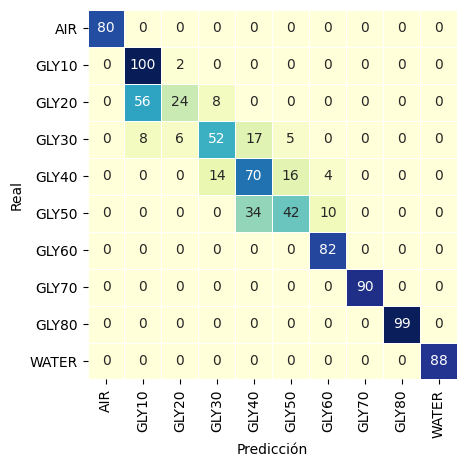

El accuracy de test de ALL es: 80.15435501653803%

################################################################################################
################################# SEPARATED: Matriz de confusión #################################
#################################################################################################



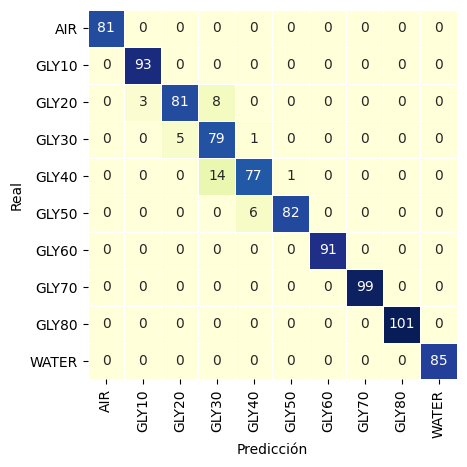

El accuracy de test de SEPARATE es: 95.81036383682469%

#################################################################################
#################################### ALL: RMSE ####################################
###################################################################################

###########################################################################
El error (rmse) de test con ALL es: 6.407799653928715
###########################################################################

#################################################################################
################################# SEPARATED: RMSE #################################
##################################################################################

###########################################################################
El error (rmse) de test con SEPARATED es: 2.075837469490228
###########################################################################


In [93]:
analisis_modelos_invidual_all (real_data_separated_TVAE_opt_ER, fake_data_separated_TVAE_opt_ER,data_separated_TVAE_opt_ER,
                                real_data_all_TVAE_opt_ER, fake_data_all_TVAE_opt_ER,data_all_TVAE_opt_ER)

#### **7.3. Entrenamiento Non Optimized**

In [97]:
data_ER = pd.read_csv("PCA_GLY_ER.csv", header=0, index_col=0)
data_ER = data_ER.drop(columns = 'Set')

my_metadata_ER_dict = SingleTableMetadata()
my_metadata_ER_dict.detect_from_dataframe(data=data_ER)

dict_data_products_ER = {}

for product in substances:
    if product == "ALL":
      dict_data_products_ER["ALL"] = data_ER
    else:
      dict_data_products_ER[product] = data_ER[data_ER[label_column]==product]

In [98]:
real_data_separated_TVAE_ER  = pd.DataFrame()
fake_data_separated_TVAE_ER = pd.DataFrame()
real_data_all_TVAE_ER  = pd.DataFrame()
fake_data_all_TVAE_ER = pd.DataFrame()

In [99]:
results_TVAE_ER = [real_data_separated_TVAE_ER, 
                fake_data_separated_TVAE_ER, 
                real_data_all_TVAE_ER, 
                fake_data_all_TVAE_ER, 
                mem_usage_TVAE, 
                time_usage_TVAE, 
                disk_usage_TVAE, 
                cpu_usage_TVAE]

model_TVAE_ER  = TVAESynthesizer(metadata=my_metadata_ER_dict)

results_TVAE_ER = entrenamiento_modelos_invidual_all ('Lector',my_metadata_ER_dict,
                                                model_TVAE_ER,
                                                dict_data_products_ER,
                                                mem_usage_TVAE,
                                                time_usage_TVAE,
                                                disk_usage_TVAE,
                                                cpu_usage_TVAE)

real_data_separated_TVAE_ER  = results_TVAE_ER[0]
fake_data_separated_TVAE_ER = results_TVAE_ER[1]
real_data_all_TVAE_ER  = results_TVAE_ER[2]
fake_data_all_TVAE_ER = results_TVAE_ER[3]
mem_usage_TVAE = results_TVAE_ER[4]
time_usage_TVAE = results_TVAE_ER[5]
disk_usage_TVAE = results_TVAE_ER[6]
cpu_usage_TVAE = results_TVAE_ER[7]

data_separated_TVAE_ER = pd.concat([real_data_separated_TVAE_ER ,fake_data_separated_TVAE_ER ],axis=0).sample(frac=1)
data_all_TVAE_ER = pd.concat([real_data_all_TVAE_ER ,fake_data_all_TVAE_ER ],axis=0).sample(frac=1)

---------------------------------------------------
Substance:WATER


c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC1'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC2'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC3'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC4'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontif

---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 21.81it/s]
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC1'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC2'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC3'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC4'. Data wil


Overall Quality Score: 92.06%

Properties:
Column Shapes: 91.36%
Column Pair Trends: 92.75%
---------------------------------------------------
---------------------------------------------------
Substance:GLY70
---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 22.99it/s]
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC1'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC2'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC3'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC4'. Data wil


Overall Quality Score: 91.25%

Properties:
Column Shapes: 91.56%
Column Pair Trends: 90.94%
---------------------------------------------------
---------------------------------------------------
Substance:GLY60
---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 21.97it/s]
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC1'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC2'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC3'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC4'. Data wil


Overall Quality Score: 91.61%

Properties:
Column Shapes: 92.01%
Column Pair Trends: 91.22%
---------------------------------------------------
---------------------------------------------------
Substance:GLY50
---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 23.45it/s]
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC1'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC2'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC3'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC4'. Data wil


Overall Quality Score: 89.68%

Properties:
Column Shapes: 88.44%
Column Pair Trends: 90.92%
---------------------------------------------------
---------------------------------------------------
Substance:GLY10
---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 24.98it/s]
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC1'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC2'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC3'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC4'. Data wil


Overall Quality Score: 90.68%

Properties:
Column Shapes: 89.27%
Column Pair Trends: 92.09%
---------------------------------------------------
---------------------------------------------------
Substance:GLY30
---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 24.53it/s]
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC1'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC2'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC3'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC4'. Data wil


Overall Quality Score: 90.59%

Properties:
Column Shapes: 89.18%
Column Pair Trends: 92.01%
---------------------------------------------------
---------------------------------------------------
Substance:GLY40
---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 24.01it/s]
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC1'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC2'. Data will not be rounded.




Overall Quality Score: 90.77%

Properties:
Column Shapes: 89.77%
Column Pair Trends: 91.77%
---------------------------------------------------
---------------------------------------------------
Substance:GLY80


c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC3'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC4'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC5'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC6'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontif

---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 21.85it/s]
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC1'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC2'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC3'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC4'. Data wil


Overall Quality Score: 92.44%

Properties:
Column Shapes: 92.96%
Column Pair Trends: 91.93%
---------------------------------------------------
---------------------------------------------------
Substance:AIR
---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 23.55it/s]
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC1'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC2'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC3'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC4'. Data wil


Overall Quality Score: 91.66%

Properties:
Column Shapes: 91.62%
Column Pair Trends: 91.7%
---------------------------------------------------
---------------------------------------------------
Substance:GLY20
---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 17.08it/s]



Overall Quality Score: 89.52%

Properties:
Column Shapes: 88.09%
Column Pair Trends: 90.94%
---------------------------------------------------
---------------------------------------------------
Substance:ALL


c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC1'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC2'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC3'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC4'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontif

---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 15.32it/s]



Overall Quality Score: 93.95%

Properties:
Column Shapes: 95.1%
Column Pair Trends: 92.8%
---------------------------------------------------

 --- TVAE:   39.5390567779541 seconds ---

 ---------- Model evaluation (SEPARATED):   


Creating report: 100%|██████████| 4/4 [00:00<00:00, 13.87it/s]



Overall Quality Score: 95.43%

Properties:
Column Shapes: 96.34%
Column Pair Trends: 94.53%

 ---------- Model evaluation (ALL):   


Creating report: 100%|██████████| 4/4 [00:00<00:00, 16.79it/s]



Overall Quality Score: 93.95%

Properties:
Column Shapes: 95.1%
Column Pair Trends: 92.8%


In [100]:
real_data_separated_TVAE_ER.to_csv(save_folder+'real_data_separated_TVAE_ER.csv', index=False)
fake_data_separated_TVAE_ER.to_csv(save_folder+'fake_data_separated_TVAE_ER.csv', index=False)
data_separated_TVAE_ER.to_csv(save_folder+'data_separated_TVAE_ER.csv', index=False)


real_data_all_TVAE_ER.to_csv(save_folder+'real_data_all_TVAE_ER.csv', index=False)
fake_data_all_TVAE_ER.to_csv(save_folder+'fake_data_all_TVAE_ER.csv', index=False)
data_all_TVAE_ER.to_csv(save_folder+'data_all_TVAE_ER.csv', index=False)

#### **7.4. Análisis Non Optimized**


################################################################################################
################################ SEPARATED: Gráfico de dispersión ################################
################################################################################################




################################################################################################
################################## ALL: Gráfico de dispersión ####################################
##################################################################################################




################################################################################################
#################################### ALL: Matriz de confusión ####################################
#################################################################################################



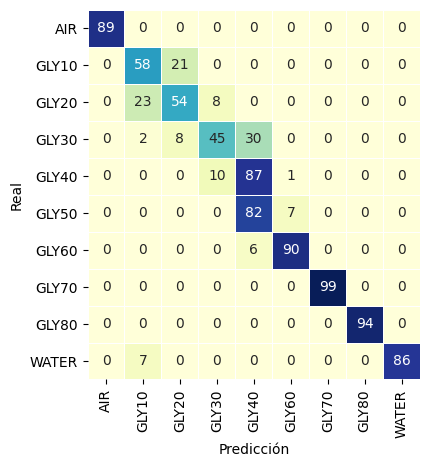

El accuracy de test de ALL es: 77.39801543550165%

################################################################################################
################################# SEPARATED: Matriz de confusión #################################
#################################################################################################



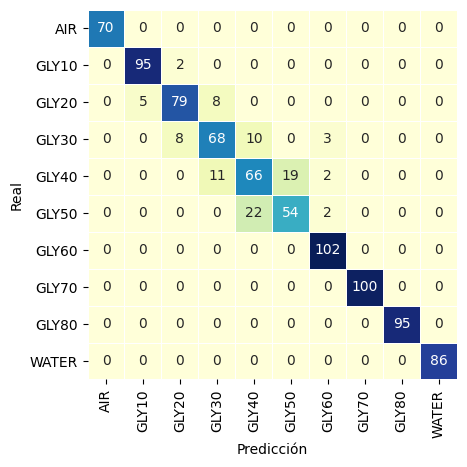

El accuracy de test de SEPARATE es: 89.8566703417861%

#################################################################################
#################################### ALL: RMSE ####################################
###################################################################################

###########################################################################
El error (rmse) de test con ALL es: 8.174295464210536
###########################################################################

#################################################################################
################################# SEPARATED: RMSE #################################
##################################################################################

###########################################################################
El error (rmse) de test con SEPARATED es: 5.69709078029022
###########################################################################


In [101]:
analisis_modelos_invidual_all (real_data_separated_TVAE_ER, fake_data_separated_TVAE_ER,data_separated_TVAE_ER,
                                real_data_all_TVAE_ER, fake_data_all_TVAE_ER,data_all_TVAE_ER)

#### **7.5. Análisis rendimiento TVAE**

In [105]:
datasets_individual_all = ['VNA','VNA_Optimized','Lector','Lector_Optimized']
for dataset in datasets_individual_all:
    min_val = min(mem_usage_TVAE['Separated'][dataset], mem_usage_TVAE['ALL'][dataset])
    mem_usage_TVAE['Separated'][dataset] /= min_val
    mem_usage_TVAE['ALL'][dataset] /= min_val

    min_val = min(time_usage_TVAE['Separated'][dataset], time_usage_TVAE['ALL'][dataset])
    time_usage_TVAE['Separated'][dataset] /= min_val
    time_usage_TVAE['ALL'][dataset] /= min_val

    min_val = min(disk_usage_TVAE['Separated'][dataset], disk_usage_TVAE['ALL'][dataset])
    disk_usage_TVAE['Separated'][dataset] /= min_val
    disk_usage_TVAE['ALL'][dataset] /= min_val

    min_val = min(cpu_usage['Separated'][dataset], cpu_usage['ALL'][dataset])
    cpu_usage_TVAE['Separated'][dataset] /= min_val
    cpu_usage_TVAE['ALL'][dataset] /= min_val

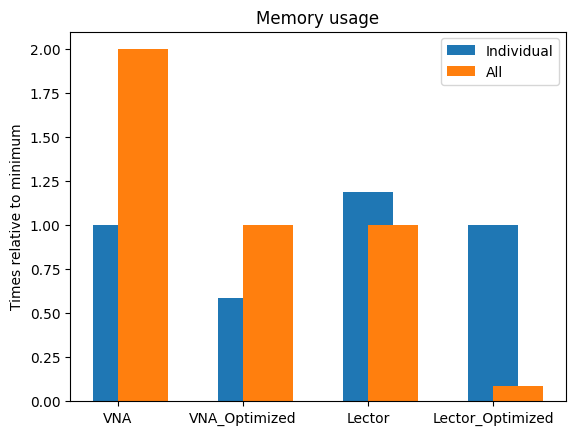

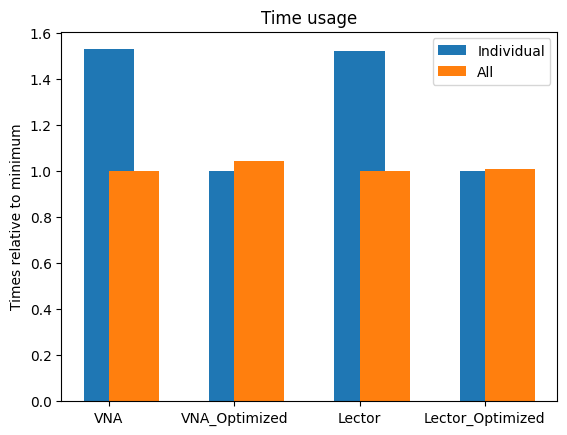

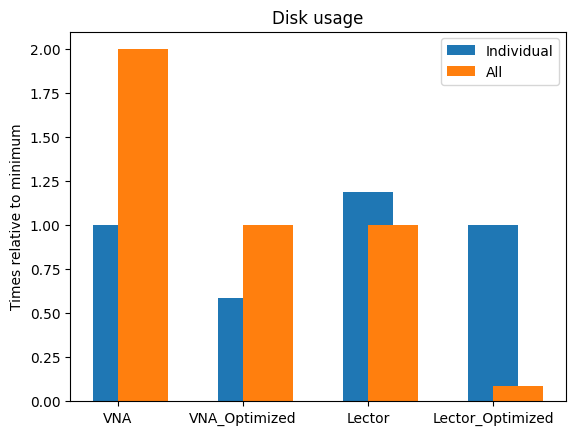

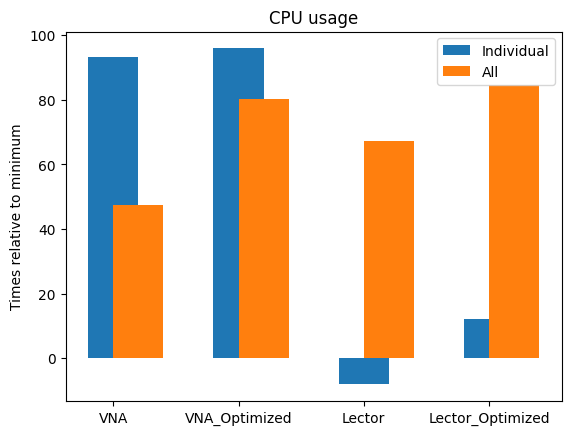

In [106]:
create_plot_separate(mem_usage_TVAE, 'Memory usage')
create_plot_separate(time_usage_TVAE, 'Time usage')
create_plot_separate(disk_usage_TVAE, 'Disk usage')
create_plot_separate(cpu_usage_TVAE, 'CPU usage')

### **8. CTGAN: Entrenamiento agrupado e individual VNA**

In [24]:
# Diccionarios para almacenar las métricas
mem_usage_CTGAN = {'Separated': {}, 'ALL': {}}
time_usage_CTGAN = {'Separated': {}, 'ALL': {}}
disk_usage_CTGAN = {'Separated': {}, 'ALL': {}}
cpu_usage_CTGAN = {'Separated': {}, 'ALL': {}}

#### **8.1. Entrenamiento Optimized**

In [108]:
data_VNA = pd.read_csv("PCA_GLY.csv", header=0, index_col=0)
data_VNA = data_VNA.rename(columns={'label': 'Label'})

my_metadata_VNA_dict = SingleTableMetadata()
my_metadata_VNA_dict.detect_from_dataframe(data=data_VNA)

dict_data_products_VNA = {}

for product in substances:
    if product == "ALL":
      dict_data_products_VNA["ALL"] = data_VNA
    else:
      dict_data_products_VNA[product] = data_VNA[data_VNA[label_column]==product]

In [109]:
real_data_separated_CTGAN_opt_VNA  = pd.DataFrame()
fake_data_separated_CTGAN_opt_VNA = pd.DataFrame()
real_data_all_CTGAN_opt_VNA  = pd.DataFrame()
fake_data_all_CTGAN_opt_VNA = pd.DataFrame()

In [110]:
results_CTGAN_opt_VNA = [real_data_separated_CTGAN_opt_VNA, 
                fake_data_separated_CTGAN_opt_VNA, 
                real_data_all_CTGAN_opt_VNA, 
                fake_data_all_CTGAN_opt_VNA, 
                mem_usage_CTGAN, 
                time_usage_CTGAN, 
                disk_usage_CTGAN, 
                cpu_usage_CTGAN]

model_CTGAN_optimized_VNA  = CTGANSynthesizer(metadata = my_metadata_VNA_dict,
                                    epochs=1000,
                                    batch_size=10,
                                    generator_dim=(64,64),
                                    discriminator_dim=(64,64),
                                    generator_lr=0.0001968,
                                    generator_decay=0.00419586,
                                    discriminator_lr=0.00019469,
                                    discriminator_decay=0.00861183,
                                    discriminator_steps=8,
                                    embedding_dim=91)

results_CTGAN_opt_VNA = entrenamiento_modelos_invidual_all ('VNA_Optimized',my_metadata_VNA_dict,
                                                model_CTGAN_optimized_VNA,
                                                dict_data_products_VNA,
                                                mem_usage_CTGAN,
                                                time_usage_CTGAN,
                                                disk_usage_CTGAN,
                                                cpu_usage_CTGAN)

real_data_separated_CTGAN_opt_VNA  = results_CTGAN_opt_VNA[0]
fake_data_separated_CTGAN_opt_VNA = results_CTGAN_opt_VNA[1]
real_data_all_CTGAN_opt_VNA  = results_CTGAN_opt_VNA[2]
fake_data_all_CTGAN_opt_VNA = results_CTGAN_opt_VNA[3]
mem_usage_CTGAN = results_CTGAN_opt_VNA[4]
time_usage_CTGAN = results_CTGAN_opt_VNA[5]
disk_usage_CTGAN = results_CTGAN_opt_VNA[6]
cpu_usage_CTGAN = results_CTGAN_opt_VNA[7]

data_separated_CTGAN_opt_VNA = pd.concat([real_data_separated_CTGAN_opt_VNA ,fake_data_separated_CTGAN_opt_VNA ],axis=0).sample(frac=1)
data_all_CTGAN_opt_VNA  = pd.concat([real_data_all_CTGAN_opt_VNA ,fake_data_all_CTGAN_opt_VNA ],axis=0).sample(frac=1)

---------------------------------------------------
Substance:WATER
---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 148.16it/s]


Overall Quality Score: 89.33%

Properties:
Column Shapes: 91.7%
Column Pair Trends: 86.96%
---------------------------------------------------
---------------------------------------------------
Substance:GLY70


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 142.34it/s]


Overall Quality Score: 89.86%

Properties:
Column Shapes: 91.15%
Column Pair Trends: 88.57%
---------------------------------------------------
---------------------------------------------------
Substance:GLY60


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 114.00it/s]


Overall Quality Score: 90.48%

Properties:
Column Shapes: 91.65%
Column Pair Trends: 89.31%
---------------------------------------------------
---------------------------------------------------
Substance:GLY50


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 132.88it/s]


Overall Quality Score: 89.63%

Properties:
Column Shapes: 92.3%
Column Pair Trends: 86.97%
---------------------------------------------------
---------------------------------------------------
Substance:GLY10


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 139.89it/s]


Overall Quality Score: 90.5%

Properties:
Column Shapes: 91.65%
Column Pair Trends: 89.35%
---------------------------------------------------
---------------------------------------------------
Substance:GLY30


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 118.75it/s]


Overall Quality Score: 89.7%

Properties:
Column Shapes: 90.65%
Column Pair Trends: 88.75%
---------------------------------------------------
---------------------------------------------------
Substance:GLY40


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 123.36it/s]


Overall Quality Score: 89.33%

Properties:
Column Shapes: 91.5%
Column Pair Trends: 87.16%
---------------------------------------------------
---------------------------------------------------
Substance:GLY80


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 131.58it/s]


Overall Quality Score: 89.44%

Properties:
Column Shapes: 90.95%
Column Pair Trends: 87.92%
---------------------------------------------------
---------------------------------------------------
Substance:AIR


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 102.31it/s]


Overall Quality Score: 90.35%

Properties:
Column Shapes: 91.94%
Column Pair Trends: 88.76%
---------------------------------------------------
---------------------------------------------------
Substance:GLY20


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 124.98it/s]


Overall Quality Score: 87.39%

Properties:
Column Shapes: 88.55%
Column Pair Trends: 86.23%
---------------------------------------------------
---------------------------------------------------
Substance:ALL


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 51.82it/s]


Overall Quality Score: 76.05%

Properties:
Column Shapes: 83.61%
Column Pair Trends: 68.49%
---------------------------------------------------



 --- TVAE:   6152.514036417007 seconds ---

 ---------- Model evaluation (SEPARATED):   


Creating report: 100%|██████████| 4/4 [00:00<00:00, 87.59it/s]



Overall Quality Score: 97.66%

Properties:
Column Shapes: 98.11%
Column Pair Trends: 97.22%

 ---------- Model evaluation (ALL):   


Creating report: 100%|██████████| 4/4 [00:00<00:00, 73.24it/s]



Overall Quality Score: 76.05%

Properties:
Column Shapes: 83.61%
Column Pair Trends: 68.49%


In [111]:
real_data_separated_CTGAN_opt_VNA.to_csv(save_folder+'real_data_separated_CTGAN_opt_VNA.csv', index=False)
fake_data_separated_CTGAN_opt_VNA.to_csv(save_folder+'fake_data_separated_CTGAN_opt_VNA.csv', index=False)
data_separated_CTGAN_opt_VNA.to_csv(save_folder+'data_separated_CTGAN_opt_VNA.csv', index=False)


real_data_all_CTGAN_opt_VNA.to_csv(save_folder+'real_data_all_CTGAN_opt_VNA.csv', index=False)
fake_data_all_CTGAN_opt_VNA.to_csv(save_folder+'fake_data_all_CTGAN_opt_VNA.csv', index=False)
data_all_CTGAN_opt_VNA.to_csv(save_folder+'data_all_CTGAN_opt_VNA.csv', index=False)

#### **8.2. Análisis Optimized**


################################################################################################
################################ SEPARATED: Gráfico de dispersión ################################
################################################################################################




################################################################################################
################################## ALL: Gráfico de dispersión ####################################
##################################################################################################




################################################################################################
#################################### ALL: Matriz de confusión ####################################
#################################################################################################



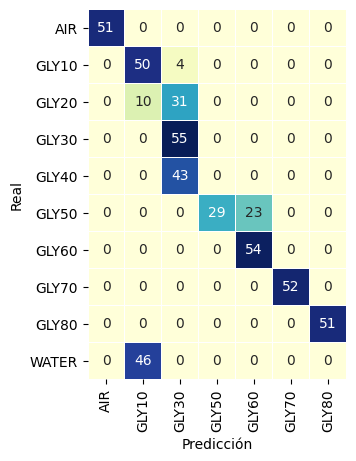

El accuracy de test de ALL es: 68.5370741482966%

################################################################################################
################################# SEPARATED: Matriz de confusión #################################
#################################################################################################



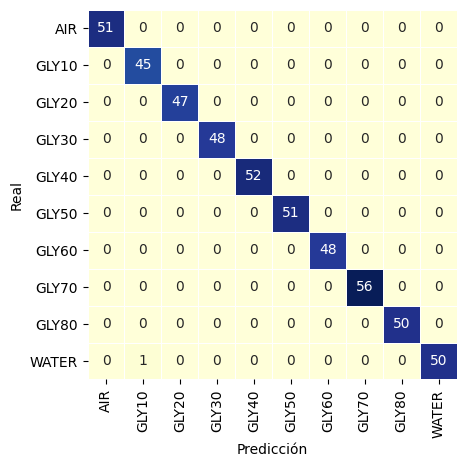

El accuracy de test de SEPARATE es: 99.79959919839679%

#################################################################################
#################################### ALL: RMSE ####################################
###################################################################################

###########################################################################
El error (rmse) de test con ALL es: 6.333867577371161
###########################################################################

#################################################################################
################################# SEPARATED: RMSE #################################
##################################################################################

###########################################################################
El error (rmse) de test con SEPARATED es: 0.9054185770363119
###########################################################################


In [112]:
analisis_modelos_invidual_all (real_data_separated_CTGAN_opt_VNA, fake_data_separated_CTGAN_opt_VNA,data_separated_CTGAN_opt_VNA,
                                    real_data_all_CTGAN_opt_VNA, fake_data_all_CTGAN_opt_VNA,data_all_CTGAN_opt_VNA)

#### **8.3. Entrenamiento Non Optimized**

In [113]:
data_VNA = pd.read_csv("PCA_GLY.csv", header=0, index_col=0)
data_VNA = data_VNA.rename(columns={'label': 'Label'})

my_metadata_VNA_dict = SingleTableMetadata()
my_metadata_VNA_dict.detect_from_dataframe(data=data_VNA)

dict_data_products_VNA = {}

for product in substances:
    if product == "ALL":
      dict_data_products_VNA["ALL"] = data_VNA
    else:
      dict_data_products_VNA[product] = data_VNA[data_VNA[label_column]==product]

In [114]:
real_data_separated_CTGAN_VNA  = pd.DataFrame()
fake_data_separated_CTGAN_VNA = pd.DataFrame()
real_data_all_CTGAN_VNA  = pd.DataFrame()
fake_data_all_CTGAN_VNA = pd.DataFrame()

In [115]:
results_CTGAN_VNA = [real_data_separated_CTGAN_VNA, 
                fake_data_separated_CTGAN_VNA, 
                real_data_all_CTGAN_VNA, 
                fake_data_all_CTGAN_VNA, 
                mem_usage_CTGAN, 
                time_usage_CTGAN, 
                disk_usage_CTGAN, 
                cpu_usage_CTGAN]

model_CTGAN_VNA  = CTGANSynthesizer(metadata = my_metadata_VNA_dict)

results_CTGAN_VNA = entrenamiento_modelos_invidual_all ('VNA',my_metadata_VNA_dict,
                                                model_CTGAN_VNA,
                                                dict_data_products_VNA,
                                                mem_usage_CTGAN,
                                                time_usage_CTGAN,
                                                disk_usage_CTGAN,
                                                cpu_usage_CTGAN)

real_data_separated_CTGAN_VNA  = results_CTGAN_VNA[0]
fake_data_separated_CTGAN_VNA = results_CTGAN_VNA[1]
real_data_all_CTGAN_VNA  = results_CTGAN_VNA[2]
fake_data_all_CTGAN_VNA = results_CTGAN_VNA[3]
mem_usage_CTGAN = results_CTGAN_VNA[4]
time_usage_CTGAN = results_CTGAN_VNA[5]
disk_usage_CTGAN = results_CTGAN_VNA[6]
cpu_usage_CTGAN = results_CTGAN_VNA[7]

data_separated_CTGAN_VNA = pd.concat([real_data_separated_CTGAN_VNA ,fake_data_separated_CTGAN_VNA ],axis=0).sample(frac=1)
data_all_CTGAN_VNA  = pd.concat([real_data_all_CTGAN_VNA ,fake_data_all_CTGAN_VNA ],axis=0).sample(frac=1)

---------------------------------------------------
Substance:WATER
---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 130.67it/s]


Overall Quality Score: 81.51%

Properties:
Column Shapes: 85.0%
Column Pair Trends: 78.01%
---------------------------------------------------
---------------------------------------------------
Substance:GLY70


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 118.93it/s]


Overall Quality Score: 72.79%

Properties:
Column Shapes: 79.55%
Column Pair Trends: 66.02%
---------------------------------------------------
---------------------------------------------------
Substance:GLY60


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 117.11it/s]


Overall Quality Score: 74.88%

Properties:
Column Shapes: 74.45%
Column Pair Trends: 75.31%
---------------------------------------------------
---------------------------------------------------
Substance:GLY50


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 113.73it/s]


Overall Quality Score: 74.71%

Properties:
Column Shapes: 80.7%
Column Pair Trends: 68.73%
---------------------------------------------------
---------------------------------------------------
Substance:GLY10


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 118.99it/s]


Overall Quality Score: 77.91%

Properties:
Column Shapes: 85.4%
Column Pair Trends: 70.42%
---------------------------------------------------
---------------------------------------------------
Substance:GLY30


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 135.17it/s]


Overall Quality Score: 74.67%

Properties:
Column Shapes: 82.6%
Column Pair Trends: 66.74%
---------------------------------------------------
---------------------------------------------------
Substance:GLY40


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 145.16it/s]


Overall Quality Score: 78.6%

Properties:
Column Shapes: 88.55%
Column Pair Trends: 68.65%
---------------------------------------------------
---------------------------------------------------
Substance:GLY80


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 118.86it/s]


Overall Quality Score: 77.81%

Properties:
Column Shapes: 86.2%
Column Pair Trends: 69.42%
---------------------------------------------------
---------------------------------------------------
Substance:AIR


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 118.79it/s]


Overall Quality Score: 71.31%

Properties:
Column Shapes: 80.0%
Column Pair Trends: 62.62%
---------------------------------------------------
---------------------------------------------------
Substance:GLY20


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 122.62it/s]


Overall Quality Score: 76.85%

Properties:
Column Shapes: 81.7%
Column Pair Trends: 72.0%
---------------------------------------------------
---------------------------------------------------
Substance:ALL


---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 46.05it/s]


Overall Quality Score: 70.41%

Properties:
Column Shapes: 81.32%
Column Pair Trends: 59.51%
---------------------------------------------------



 --- TVAE:   33.30883550643921 seconds ---

 ---------- Model evaluation (SEPARATED):   


Creating report: 100%|██████████| 4/4 [00:00<00:00, 98.47it/s]



Overall Quality Score: 93.63%

Properties:
Column Shapes: 95.8%
Column Pair Trends: 91.46%

 ---------- Model evaluation (ALL):   


Creating report: 100%|██████████| 4/4 [00:00<00:00, 55.04it/s]



Overall Quality Score: 70.41%

Properties:
Column Shapes: 81.32%
Column Pair Trends: 59.51%


In [117]:
real_data_separated_CTGAN_VNA.to_csv(save_folder+'real_data_separated_CTGAN_VNA.csv', index=False)
fake_data_separated_CTGAN_VNA.to_csv(save_folder+'fake_data_separated_CTGAN_VNA.csv', index=False)
data_separated_CTGAN_VNA.to_csv(save_folder+'data_separated_CTGAN_VNA.csv', index=False)


real_data_all_CTGAN_VNA.to_csv(save_folder+'real_data_al_CTGAN_VNA.csv', index=False)
fake_data_all_CTGAN_VNA.to_csv(save_folder+'fake_data_all_CTGAN_VNA.csv', index=False)
data_all_CTGAN_VNA.to_csv(save_folder+'data_all_CTGAN_VNA.csv', index=False)

#### **8.4. Análisis Non Optimized**


################################################################################################
################################ SEPARATED: Gráfico de dispersión ################################
################################################################################################




################################################################################################
################################## ALL: Gráfico de dispersión ####################################
##################################################################################################




################################################################################################
#################################### ALL: Matriz de confusión ####################################
#################################################################################################



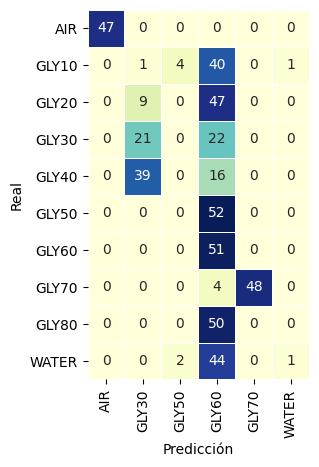

El accuracy de test de ALL es: 33.66733466933868%

################################################################################################
################################# SEPARATED: Matriz de confusión #################################
#################################################################################################



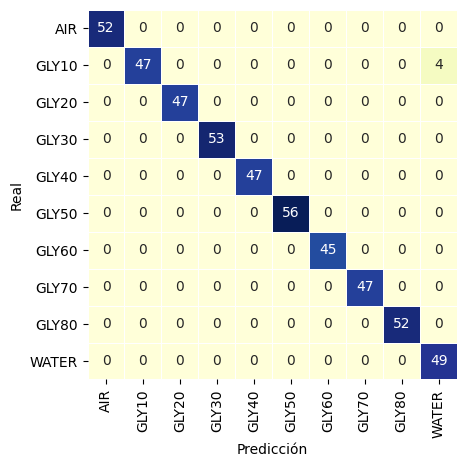

El accuracy de test de SEPARATE es: 99.19839679358718%

#################################################################################
#################################### ALL: RMSE ####################################
###################################################################################

###########################################################################
El error (rmse) de test con ALL es: 17.008823905920828
###########################################################################

#################################################################################
################################# SEPARATED: RMSE #################################
##################################################################################

###########################################################################
El error (rmse) de test con SEPARATED es: 1.145375331915443
###########################################################################


In [119]:
analisis_modelos_invidual_all (real_data_separated_CTGAN_VNA, fake_data_separated_CTGAN_VNA,data_separated_CTGAN_VNA,
                                    real_data_all_CTGAN_VNA, fake_data_all_CTGAN_VNA,data_all_CTGAN_VNA)

### **9. CTGAN: Entrenamiento agrupado e individual ER**

#### **9.1. Entrenamiento Optimized**

In [21]:
data_ER = pd.read_csv("PCA_GLY_ER.csv", header=0, index_col=0)
data_ER = data_ER.drop(columns = 'Set')

my_metadata_ER_dict = SingleTableMetadata()
my_metadata_ER_dict.detect_from_dataframe(data=data_ER)

dict_data_products_ER = {}

for product in substances:
    if product == "ALL":
      dict_data_products_ER["ALL"] = data_ER
    else:
      dict_data_products_ER[product] = data_ER[data_ER[label_column]==product]

In [22]:
real_data_separated_CTGAN_opt_ER  = pd.DataFrame()
fake_data_separated_CTGAN_opt_ER = pd.DataFrame()
real_data_all_CTGAN_opt_ER  = pd.DataFrame()
fake_data_all_CTGAN_opt_ER = pd.DataFrame()

In [25]:
results_CTGAN_opt_ER = [real_data_separated_CTGAN_opt_ER, 
                fake_data_separated_CTGAN_opt_ER, 
                real_data_all_CTGAN_opt_ER, 
                fake_data_all_CTGAN_opt_ER, 
                mem_usage_CTGAN, 
                time_usage_CTGAN, 
                disk_usage_CTGAN, 
                cpu_usage_CTGAN]

model_CTGAN_optimized_ER  = CTGANSynthesizer(metadata = my_metadata_ER_dict,
                                    epochs=1000,
                                    batch_size=10,
                                    generator_dim=(64,64),
                                    discriminator_dim=(64,64),
                                    generator_lr=0.0001968,
                                    generator_decay=0.00419586,
                                    discriminator_lr=0.00019469,
                                    discriminator_decay=0.00861183,
                                    discriminator_steps=8,
                                    embedding_dim=91)

results_CTGAN_opt_ER = entrenamiento_modelos_invidual_all ('Lector_Optimized',my_metadata_ER_dict,
                                                model_CTGAN_optimized_ER,
                                                dict_data_products_ER,
                                                mem_usage_CTGAN,
                                                time_usage_CTGAN,
                                                disk_usage_CTGAN,
                                                cpu_usage_CTGAN)

real_data_separated_CTGAN_opt_ER  = results_CTGAN_opt_ER[0]
fake_data_separated_CTGAN_opt_ER = results_CTGAN_opt_ER[1]
real_data_all_CTGAN_opt_ER  = results_CTGAN_opt_ER[2]
fake_data_all_CTGAN_opt_ER = results_CTGAN_opt_ER[3]
mem_usage_CTGAN = results_CTGAN_opt_ER[4]
time_usage_CTGAN = results_CTGAN_opt_ER[5]
disk_usage_CTGAN = results_CTGAN_opt_ER[6]
cpu_usage_CTGAN = results_CTGAN_opt_ER[7]

data_separated_CTGAN_opt_ER = pd.concat([real_data_separated_CTGAN_opt_ER ,fake_data_separated_CTGAN_opt_ER ],axis=0).sample(frac=1)
data_all_CTGAN_opt_ER = pd.concat([real_data_all_CTGAN_opt_ER ,fake_data_all_CTGAN_opt_ER ],axis=0).sample(frac=1)

---------------------------------------------------
Substance:WATER


c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No rounding scheme detected for column 'PC1'. Data will not be rounded.
  warnings.warn(
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No rounding scheme detected for column 'PC2'. Data will not be rounded.
  warnings.warn(
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No rounding scheme detected for column 'PC3'. Data will not be rounded.
  warnings.warn(
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No rounding scheme detected for column 'PC4'. Data will not be rounded.
 

---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 21.71it/s]
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No rounding scheme detected for column 'PC1'. Data will not be rounded.
  warnings.warn(
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No rounding scheme detected for column 'PC2'. Data will not be rounded.
  warnings.warn(
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No rounding scheme detected for column 'PC3'. Data will not be rounded.
  warnings.warn(
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No roundin


Overall Quality Score: 90.93%

Properties:
Column Shapes: 90.46%
Column Pair Trends: 91.41%
---------------------------------------------------
---------------------------------------------------
Substance:GLY70
---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 21.23it/s]
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No rounding scheme detected for column 'PC1'. Data will not be rounded.
  warnings.warn(
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No rounding scheme detected for column 'PC2'. Data will not be rounded.
  warnings.warn(
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No rounding scheme detected for column 'PC3'. Data will not be rounded.
  warnings.warn(
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No roundin


Overall Quality Score: 91.77%

Properties:
Column Shapes: 92.28%
Column Pair Trends: 91.26%
---------------------------------------------------
---------------------------------------------------
Substance:GLY60
---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 19.26it/s]
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No rounding scheme detected for column 'PC1'. Data will not be rounded.
  warnings.warn(
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No rounding scheme detected for column 'PC2'. Data will not be rounded.
  warnings.warn(
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No rounding scheme detected for column 'PC3'. Data will not be rounded.
  warnings.warn(
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No roundin


Overall Quality Score: 90.54%

Properties:
Column Shapes: 90.8%
Column Pair Trends: 90.29%
---------------------------------------------------
---------------------------------------------------
Substance:GLY50
---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 21.88it/s]
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No rounding scheme detected for column 'PC1'. Data will not be rounded.
  warnings.warn(
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No rounding scheme detected for column 'PC2'. Data will not be rounded.
  warnings.warn(
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No rounding scheme detected for column 'PC3'. Data will not be rounded.
  warnings.warn(
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No roundin


Overall Quality Score: 89.9%

Properties:
Column Shapes: 89.07%
Column Pair Trends: 90.72%
---------------------------------------------------
---------------------------------------------------
Substance:GLY10
---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 23.76it/s]
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No rounding scheme detected for column 'PC1'. Data will not be rounded.
  warnings.warn(
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No rounding scheme detected for column 'PC2'. Data will not be rounded.
  warnings.warn(
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No rounding scheme detected for column 'PC3'. Data will not be rounded.
  warnings.warn(
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No roundin


Overall Quality Score: 90.76%

Properties:
Column Shapes: 89.55%
Column Pair Trends: 91.97%
---------------------------------------------------
---------------------------------------------------
Substance:GLY30
---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 22.29it/s]
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No rounding scheme detected for column 'PC1'. Data will not be rounded.
  warnings.warn(
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No rounding scheme detected for column 'PC2'. Data will not be rounded.
  warnings.warn(
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No rounding scheme detected for column 'PC3'. Data will not be rounded.
  warnings.warn(
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No roundin


Overall Quality Score: 92.59%

Properties:
Column Shapes: 92.36%
Column Pair Trends: 92.82%
---------------------------------------------------
---------------------------------------------------
Substance:GLY40
---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 19.19it/s]
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No rounding scheme detected for column 'PC1'. Data will not be rounded.
  warnings.warn(
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No rounding scheme detected for column 'PC2'. Data will not be rounded.
  warnings.warn(
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No rounding scheme detected for column 'PC3'. Data will not be rounded.
  warnings.warn(
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No roundin


Overall Quality Score: 92.57%

Properties:
Column Shapes: 92.56%
Column Pair Trends: 92.58%
---------------------------------------------------
---------------------------------------------------
Substance:GLY80
---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 14.63it/s]
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No rounding scheme detected for column 'PC1'. Data will not be rounded.
  warnings.warn(
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No rounding scheme detected for column 'PC2'. Data will not be rounded.
  warnings.warn(
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No rounding scheme detected for column 'PC3'. Data will not be rounded.
  warnings.warn(
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No roundin


Overall Quality Score: 91.31%

Properties:
Column Shapes: 90.52%
Column Pair Trends: 92.1%
---------------------------------------------------
---------------------------------------------------
Substance:AIR
---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 17.47it/s]
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No rounding scheme detected for column 'PC1'. Data will not be rounded.
  warnings.warn(
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No rounding scheme detected for column 'PC2'. Data will not be rounded.
  warnings.warn(



Overall Quality Score: 88.53%

Properties:
Column Shapes: 88.64%
Column Pair Trends: 88.41%
---------------------------------------------------
---------------------------------------------------
Substance:GLY20


c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No rounding scheme detected for column 'PC3'. Data will not be rounded.
  warnings.warn(
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No rounding scheme detected for column 'PC4'. Data will not be rounded.
  warnings.warn(
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No rounding scheme detected for column 'PC5'. Data will not be rounded.
  warnings.warn(
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No rounding scheme detected for column 'PC6'. Data will not be rounded.
 

---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 21.08it/s]



Overall Quality Score: 89.34%

Properties:
Column Shapes: 87.45%
Column Pair Trends: 91.23%
---------------------------------------------------
---------------------------------------------------
Substance:ALL


c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No rounding scheme detected for column 'PC1'. Data will not be rounded.
  warnings.warn(
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No rounding scheme detected for column 'PC2'. Data will not be rounded.
  warnings.warn(
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No rounding scheme detected for column 'PC3'. Data will not be rounded.
  warnings.warn(
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning: No rounding scheme detected for column 'PC4'. Data will not be rounded.
 

---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 12.33it/s]



Overall Quality Score: 89.51%

Properties:
Column Shapes: 89.99%
Column Pair Trends: 89.04%
---------------------------------------------------

 --- TVAE:   18068.545805692673 seconds ---

 ---------- Model evaluation (SEPARATED):   


Creating report: 100%|██████████| 4/4 [00:00<00:00, 14.03it/s]



Overall Quality Score: 95.79%

Properties:
Column Shapes: 96.09%
Column Pair Trends: 95.49%

 ---------- Model evaluation (ALL):   


Creating report: 100%|██████████| 4/4 [00:00<00:00, 12.42it/s]



Overall Quality Score: 89.51%

Properties:
Column Shapes: 89.99%
Column Pair Trends: 89.04%


In [26]:
real_data_separated_CTGAN_opt_ER.to_csv(save_folder+'real_data_separated_CTGAN_opt_ER.csv', index=False)
fake_data_separated_CTGAN_opt_ER.to_csv(save_folder+'fake_data_separated_CTGAN_opt_ER.csv', index=False)
data_separated_CTGAN_opt_ER.to_csv(save_folder+'data_separated_CTGAN_opt_ER.csv', index=False)


real_data_all_CTGAN_opt_ER.to_csv(save_folder+'real_data_all_CTGAN_opt_ER.csv', index=False)
fake_data_all_CTGAN_opt_ER.to_csv(save_folder+'fake_data_all_CTGAN_opt_ER.csv', index=False)
data_all_CTGAN_opt_ER.to_csv(save_folder+'data_all_CTGAN_opt_ER.csv', index=False)

#### **9.2. Analisis Optimized**


################################################################################################
################################ SEPARATED: Gráfico de dispersión ################################
################################################################################################




################################################################################################
################################## ALL: Gráfico de dispersión ####################################
##################################################################################################




################################################################################################
#################################### ALL: Matriz de confusión ####################################
#################################################################################################



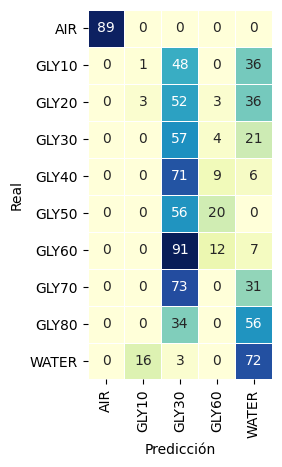

El accuracy de test de ALL es: 25.468577728776186%

################################################################################################
################################# SEPARATED: Matriz de confusión #################################
#################################################################################################



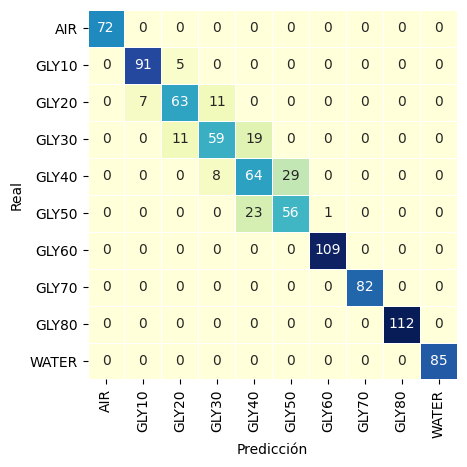

El accuracy de test de SEPARATE es: 87.43109151047409%

#################################################################################
#################################### ALL: RMSE ####################################
###################################################################################

###########################################################################
El error (rmse) de test con ALL es: 23.828219479004673
###########################################################################

#################################################################################
################################# SEPARATED: RMSE #################################
##################################################################################

###########################################################################
El error (rmse) de test con SEPARATED es: 8.654224548152822
###########################################################################


In [27]:
analisis_modelos_invidual_all (real_data_separated_CTGAN_opt_ER, fake_data_separated_CTGAN_opt_ER,data_separated_CTGAN_opt_ER,
                                real_data_all_CTGAN_opt_ER, fake_data_all_CTGAN_opt_ER,data_all_CTGAN_opt_ER)

#### **9.3. Entrenamiento Non-Optimized**

In [28]:
data_ER = pd.read_csv("PCA_GLY_ER.csv", header=0, index_col=0)
data_ER = data_ER.drop(columns = 'Set')

my_metadata_ER_dict = SingleTableMetadata()
my_metadata_ER_dict.detect_from_dataframe(data=data_ER)

dict_data_products_ER = {}

for product in substances:
    if product == "ALL":
      dict_data_products_ER["ALL"] = data_ER
    else:
      dict_data_products_ER[product] = data_ER[data_ER[label_column]==product]

In [29]:
real_data_separated_CTGAN_ER  = pd.DataFrame()
fake_data_separated_CTGAN_ER = pd.DataFrame()
real_data_all_CTGAN_ER  = pd.DataFrame()
fake_data_all_CTGAN_ER = pd.DataFrame()

In [30]:
results_CTGAN_ER = [real_data_separated_CTGAN_ER, 
                fake_data_separated_CTGAN_ER, 
                real_data_all_CTGAN_ER, 
                fake_data_all_CTGAN_ER, 
                mem_usage_CTGAN, 
                time_usage_CTGAN, 
                disk_usage_CTGAN, 
                cpu_usage_CTGAN]

model_CTGAN_ER  = CTGANSynthesizer(metadata = my_metadata_ER_dict)

results_CTGAN_ER = entrenamiento_modelos_invidual_all ('Lector',my_metadata_ER_dict,
                                                model_CTGAN_ER,
                                                dict_data_products_ER,
                                                mem_usage_CTGAN,
                                                time_usage_CTGAN,
                                                disk_usage_CTGAN,
                                                cpu_usage_CTGAN)

real_data_separated_CTGAN_ER  = results_CTGAN_ER[0]
fake_data_separated_CTGAN_ER = results_CTGAN_ER[1]
real_data_all_CTGAN_ER  = results_CTGAN_ER[2]
fake_data_all_CTGAN_ER = results_CTGAN_ER[3]
mem_usage_CTGAN = results_CTGAN_ER[4]
time_usage_CTGAN = results_CTGAN_ER[5]
disk_usage_CTGAN = results_CTGAN_ER[6]
cpu_usage_CTGAN = results_CTGAN_ER[7]

data_separated_CTGAN_ER = pd.concat([real_data_separated_CTGAN_ER ,fake_data_separated_CTGAN_ER ],axis=0).sample(frac=1)
data_all_CTGAN_ER = pd.concat([real_data_all_CTGAN_ER,fake_data_all_CTGAN_ER ],axis=0).sample(frac=1)

---------------------------------------------------
Substance:WATER


c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC1'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC2'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC3'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC4'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontif

---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 24.93it/s]
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC1'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC2'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC3'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC4'. Data wil


Overall Quality Score: 84.69%

Properties:
Column Shapes: 82.66%
Column Pair Trends: 86.71%
---------------------------------------------------
---------------------------------------------------
Substance:GLY70
---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 21.42it/s]
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC1'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC2'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC3'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC4'. Data wil


Overall Quality Score: 83.89%

Properties:
Column Shapes: 83.39%
Column Pair Trends: 84.39%
---------------------------------------------------
---------------------------------------------------
Substance:GLY60
---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 22.88it/s]
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC1'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC2'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC3'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC4'. Data wil


Overall Quality Score: 83.87%

Properties:
Column Shapes: 84.39%
Column Pair Trends: 83.35%
---------------------------------------------------
---------------------------------------------------
Substance:GLY50
---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 22.58it/s]
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC1'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC2'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC3'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC4'. Data wil


Overall Quality Score: 84.6%

Properties:
Column Shapes: 81.54%
Column Pair Trends: 87.66%
---------------------------------------------------
---------------------------------------------------
Substance:GLY10
---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 22.56it/s]
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC1'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC2'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC3'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC4'. Data wil


Overall Quality Score: 86.44%

Properties:
Column Shapes: 84.31%
Column Pair Trends: 88.57%
---------------------------------------------------
---------------------------------------------------
Substance:GLY30
---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 22.50it/s]



Overall Quality Score: 83.08%

Properties:
Column Shapes: 77.66%
Column Pair Trends: 88.5%
---------------------------------------------------
---------------------------------------------------
Substance:GLY40


c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC1'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC2'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC3'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC4'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontif

---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 22.99it/s]
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC1'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC2'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC3'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC4'. Data wil


Overall Quality Score: 84.7%

Properties:
Column Shapes: 80.76%
Column Pair Trends: 88.64%
---------------------------------------------------
---------------------------------------------------
Substance:GLY80
---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 21.49it/s]
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC1'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC2'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC3'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC4'. Data wil


Overall Quality Score: 83.34%

Properties:
Column Shapes: 78.9%
Column Pair Trends: 87.78%
---------------------------------------------------
---------------------------------------------------
Substance:AIR
---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 22.67it/s]
c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC1'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC2'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC3'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC4'. Data wil


Overall Quality Score: 84.47%

Properties:
Column Shapes: 84.98%
Column Pair Trends: 83.96%
---------------------------------------------------
---------------------------------------------------
Substance:GLY20
---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 22.21it/s]



Overall Quality Score: 85.96%

Properties:
Column Shapes: 82.64%
Column Pair Trends: 89.28%
---------------------------------------------------
---------------------------------------------------
Substance:ALL


c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC1'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC2'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC3'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontificia Comillas\5º\GITT TFG\Anexos\Modelo Spectral\.venv\lib\site-packages\rdt\transformers\numerical.py:100: UserWarning:

No rounding scheme detected for column 'PC4'. Data will not be rounded.

c:\Users\javie\OneDrive - Universidad Pontif

---------- Model evaluation:   



Creating report: 100%|██████████| 4/4 [00:00<00:00, 10.34it/s]



Overall Quality Score: 86.53%

Properties:
Column Shapes: 85.48%
Column Pair Trends: 87.57%
---------------------------------------------------

 --- TVAE:   99.71361136436462 seconds ---

 ---------- Model evaluation (SEPARATED):   


Creating report: 100%|██████████| 4/4 [00:00<00:00, 14.27it/s]



Overall Quality Score: 93.44%

Properties:
Column Shapes: 93.72%
Column Pair Trends: 93.16%

 ---------- Model evaluation (ALL):   


Creating report: 100%|██████████| 4/4 [00:00<00:00, 13.05it/s]



Overall Quality Score: 86.53%

Properties:
Column Shapes: 85.48%
Column Pair Trends: 87.57%


In [31]:
real_data_separated_CTGAN_ER.to_csv(save_folder+'real_data_separated_CTGAN_ER.csv', index=False)
fake_data_separated_CTGAN_ER.to_csv(save_folder+'fake_data_separated_CTGAN_ER.csv', index=False)
data_separated_CTGAN_ER.to_csv(save_folder+'data_separated_CTGAN_ER.csv', index=False)


real_data_all_CTGAN_ER.to_csv(save_folder+'real_data_al_CTGAN_ER.csv', index=False)
fake_data_all_CTGAN_ER.to_csv(save_folder+'fake_data_all_CTGAN_ER.csv', index=False)
data_all_CTGAN_ER.to_csv(save_folder+'data_all_CTGAN_ER.csv', index=False)

#### **9.4. Analisis Non-Optimized**


################################################################################################
################################ SEPARATED: Gráfico de dispersión ################################
################################################################################################




################################################################################################
################################## ALL: Gráfico de dispersión ####################################
##################################################################################################




################################################################################################
#################################### ALL: Matriz de confusión ####################################
#################################################################################################



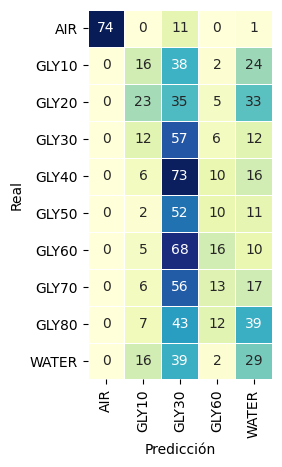

El accuracy de test de ALL es: 21.168687982359426%

################################################################################################
################################# SEPARATED: Matriz de confusión #################################
#################################################################################################



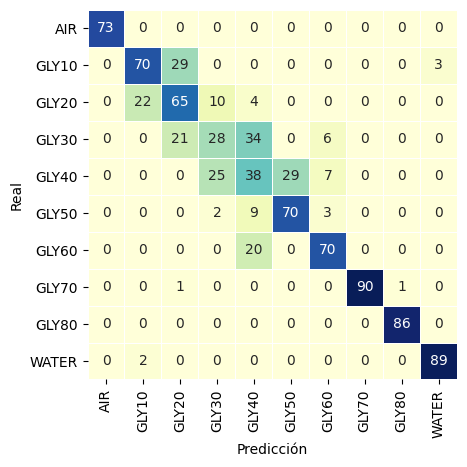

El accuracy de test de SEPARATE es: 74.86218302094818%

#################################################################################
#################################### ALL: RMSE ####################################
###################################################################################

###########################################################################
El error (rmse) de test con ALL es: 26.45042178181732
###########################################################################

#################################################################################
################################# SEPARATED: RMSE #################################
##################################################################################

###########################################################################
El error (rmse) de test con SEPARATED es: 9.562175365593722
###########################################################################


In [32]:
analisis_modelos_invidual_all (real_data_separated_CTGAN_ER, fake_data_separated_CTGAN_ER,data_separated_CTGAN_ER,
                                real_data_all_CTGAN_ER, fake_data_all_CTGAN_ER,data_all_CTGAN_ER)

#### **9.5. Analisis de Rendimiento**

for dataset in datasets_individual_all:
    min_val = min(mem_usage_TVAE['Separated'][dataset], mem_usage_TVAE['ALL'][dataset])
    mem_usage_TVAE['Separated'][dataset] /= min_val
    mem_usage_TVAE['ALL'][dataset] /= min_val

    min_val = min(time_usage_TVAE['Separated'][dataset], time_usage_TVAE['ALL'][dataset])
    time_usage_TVAE['Separated'][dataset] /= min_val
    time_usage_TVAE['ALL'][dataset] /= min_val

    min_val = min(disk_usage_TVAE['Separated'][dataset], disk_usage_TVAE['ALL'][dataset])
    disk_usage_TVAE['Separated'][dataset] /= min_val
    disk_usage_TVAE['ALL'][dataset] /= min_val

    min_val = min(cpu_usage['Separated'][dataset], cpu_usage['ALL'][dataset])
    cpu_usage_TVAE['Separated'][dataset] /= min_val
    cpu_usage_TVAE['ALL'][dataset] /= min_val

In [33]:
create_plot_separate(mem_usage_CTGAN, 'Memory usage')
create_plot_separate(time_usage_CTGAN, 'Time usage')
create_plot_separate(disk_usage_CTGAN, 'Disk usage')
create_plot_separate(cpu_usage_CTGAN, 'CPU usage')

KeyError: 'VNA'